In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached Jinja2-3.1.2-py3-none-any.whl (133 kB)
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
notebook 5.7.16 requires jinja2<=3.0.0, but you have jinja2 3.1.2 which is incompatible.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which is incompatible.


In [ ]:
!pip install explainerdashboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached Jinja2-2.11.3-py2.py3-none-any.whl (125 kB)
  Attempting uninstall: Jinja2
    Found existing installation: Jinja2 3.1.2
    Uninstalling Jinja2-3.1.2:
      Successfully uninstalled Jinja2-3.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
eli5 0.13.0 requires jinja2>=3.0.0, but you have jinja2 2.11.3 which is incompatible.


In [ ]:
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

%matplotlib inline
sns.set_style(style="darkgrid")
plt.style.use("bmh")

import warnings
warnings.filterwarnings('ignore')

In [ ]:
pd.set_option('display.float','{:.2f}'.format)

In [ ]:
# file_path = "/content/drive/MyDrive/LJMU/Dataset/UCI/cleveland.data"
# # above .data file is comma delimited
# with open(file_path, encoding="utf8", errors='ignore') as f:
#   wine_data = pd.read_csv(file_path, delimiter=",")

In [ ]:
try:
  file_path = "/content/drive/MyDrive/LJMU/Dataset/UCI/cleveland.data"
  # above .data file is comma delimited
  with open(file_path, encoding="utf8", errors='ignore') as f:
    wine_data = pd.read_csv(file_path, delimiter=",")
except:
  print('there is an error')

there is an error


In [ ]:
# Chardet: The Universal Character Encoding Detector (ASCII, UTF-8, UTF-16, UTF-32,Big5, GB2312, EUC-TW, HZ-GB-2312 etc)
import chardet

In [ ]:
datasets_read = ['processed_switzerland', 'processed_hungarian', 'processed_cleveland']

In [ ]:
fp = '/content/drive/MyDrive/LJMU/Dataset/UCI/'

In [ ]:
column_names =  ['age','sex','cp','trestbps','chol','fbs','restecg','thalach','exang','oldpeak','slope','ca','thal','num']

In [ ]:
df_dict = {}
for ds in datasets_read:
  filename = fp+ds+'.data'
  print(filename)

  # Checking the encoding of heart disease file
  with open(filename, 'rb') as rawdata:
      result = chardet.detect(rawdata.read())

  # check what the character encoding might be
  print(result)

  df_dict[ds] = pd.read_csv(filename, names=column_names)
  print(df_dict[ds].shape)
  print()


/content/drive/MyDrive/LJMU/Dataset/UCI/processed_switzerland.data
{'encoding': 'ascii', 'confidence': 1.0, 'language': ''}
(123, 14)

/content/drive/MyDrive/LJMU/Dataset/UCI/processed_hungarian.data
{'encoding': 'ascii', 'confidence': 1.0, 'language': ''}
(294, 14)

/content/drive/MyDrive/LJMU/Dataset/UCI/processed_cleveland.data
{'encoding': 'ascii', 'confidence': 1.0, 'language': ''}
(303, 14)



In [ ]:
heart_df = pd.concat([df_dict['processed_switzerland'],
                     df_dict['processed_hungarian'],
                     df_dict['processed_cleveland']])
heart_df.shape

(720, 14)

In [ ]:
heart_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 720 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       720 non-null    float64
 1   sex       720 non-null    float64
 2   cp        720 non-null    float64
 3   trestbps  720 non-null    object 
 4   chol      720 non-null    object 
 5   fbs       720 non-null    object 
 6   restecg   720 non-null    object 
 7   thalach   720 non-null    object 
 8   exang     720 non-null    object 
 9   oldpeak   720 non-null    object 
 10  slope     720 non-null    object 
 11  ca        720 non-null    object 
 12  thal      720 non-null    object 
 13  num       720 non-null    int64  
dtypes: float64(3), int64(1), object(10)
memory usage: 84.4+ KB


In [ ]:
heart_df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,32.00,1.00,1.00,95,0,?,0,127,0,.7,1,?,?,1
1,34.00,1.00,4.00,115,0,?,?,154,0,.2,1,?,?,1
2,35.00,1.00,4.00,?,0,?,0,130,1,?,?,?,7,3
3,36.00,1.00,4.00,110,0,?,0,125,1,1,2,?,6,1
4,38.00,0.00,4.00,105,0,?,0,166,0,2.8,1,?,?,2


# How EDA from my dataset contributes to global and modal agnostic explanations?

# EDA

## How many data is with special characters?

In [ ]:
heart_withQuestion_df = heart_df[(heart_df == '?').any(axis=1)]
heart_withQuestion_df.shape

(422, 14)

## Filtering data which are valid

In [ ]:
heart_removeQuestion_df = heart_df[~(heart_df == '?').any(axis=1)]
heart_removeQuestion_df.shape

(298, 14)

### Very less data fetched as 298 when removed all data containing '?'. Hence analysing the data containing '?' to perform dropping the invalid data and impute data with proper values 

In [ ]:
question_cols = [colname for colname in heart_df.columns if (heart_withQuestion_df[colname] == '?').any()]
question_cols

['trestbps',
 'chol',
 'fbs',
 'restecg',
 'thalach',
 'exang',
 'oldpeak',
 'slope',
 'ca',
 'thal']

### Checking the unique value present in each feature containing the value as '?'

In [ ]:
nuniqueFeatureCount = [f'{colname} unique value present : {heart_df[colname].nunique()}' for colname in question_cols]
nuniqueFeatureCount

['trestbps unique value present : 86',
 'chol unique value present : 307',
 'fbs unique value present : 5',
 'restecg unique value present : 7',
 'thalach unique value present : 188',
 'exang unique value present : 5',
 'oldpeak unique value present : 77',
 'slope unique value present : 7',
 'ca unique value present : 8',
 'thal unique value present : 7']

### Dropping the rows of column containg the value '?' as the value count for these following columns are less than 10 rows


In [ ]:
heart_df = heart_df[~(heart_df['trestbps'] == '?')]
heart_df.shape

(717, 14)

In [ ]:
heart_df = heart_df[~(heart_df['restecg'] == '?')]
heart_df.shape

(715, 14)

In [ ]:
heart_df = heart_df[~(heart_df['oldpeak'] == '?')]
heart_df.shape

(711, 14)

## Imputing values by replacing special character '?' with mode value.

In [ ]:
cols_to_replace = [colname for colname in heart_df.columns if (heart_df[colname] == '?').any()]
cols_to_replace

['chol', 'fbs', 'slope', 'ca', 'thal']

In [ ]:
heart_df.thal.value_counts().index.tolist()

['?', '3.0', '7.0', '7', '3', '6', '6.0']

In [ ]:
colname = 'thal'
val_count_list = heart_df[colname].value_counts().index.tolist()
val_count_list

['?', '3.0', '7.0', '7', '3', '6', '6.0']

In [ ]:
print(heart_df.chol.value_counts().index.tolist()) ## To take mean

[0, '?', 234.0, 197.0, 204.0, '230', '246', '275', 254.0, 212.0, 269.0, 226.0, 211.0, 239.0, 177.0, 243.0, 233.0, 240.0, '216', '263', '238', '224', '196', '215', 282.0, '211', '260', '237', '223', '201', '225', 229.0, 230.0, 223.0, 258.0, 219.0, 201.0, 245.0, 283.0, '195', '264', 199.0, 263.0, 256.0, 244.0, 274.0, 203.0, '220', 236.0, '160', 303.0, '207', 231.0, 288.0, '297', '292', '182', '288', '193', '213', 220.0, '248', '198', '222', 246.0, 250.0, '291', '268', '219', '184', 249.0, 309.0, 222.0, 260.0, 227.0, '341', 286.0, 264.0, 209.0, '342', 325.0, 235.0, 255.0, '231', 265.0, 275.0, 268.0, 208.0, 188.0, 304.0, 216.0, 305.0, 213.0, 273.0, 253.0, 198.0, '243', 175.0, 330.0, 302.0, 225.0, 267.0, 248.0, '254', 335.0, 247.0, '298', 206.0, 308.0, 266.0, 261.0, '214', 270.0, 294.0, 192.0, '265', 221.0, '179', '163', 196.0, '180', '272', '188', 228.0, 193.0, '202', 271.0, '253', '284', '276', '257', '280', '209', 315.0, 149.0, 295.0, '186', '266', '249', 218.0, '245', '250', '289', '273

In [ ]:
print(heart_df.fbs.value_counts().index.tolist()) ## To take mean

['0', 0.0, '?', 1.0, '1']


In [ ]:
print(heart_df.slope.value_counts().index.tolist()) ## To take mean

['?', '2', 1.0, 2.0, '1', 3.0, '3']


In [ ]:
print(heart_df.ca.value_counts().index.tolist()) ## To take mean

['?', '0.0', '1.0', '2.0', '3.0', '2', '0', '1']


In [ ]:
print(heart_df.thal.value_counts().index.tolist()) ## To take mean

['?', '3.0', '7.0', '7', '3', '6', '6.0']


In [ ]:
heart_df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,32.00,1.00,1.00,95,0,?,0,127,0,.7,1,?,?,1
3,36.00,1.00,4.00,110,0,?,0,125,1,1,2,?,6,1
4,38.00,0.00,4.00,105,0,?,0,166,0,2.8,1,?,?,2
5,38.00,0.00,4.00,110,0,0,0,156,0,0,2,?,3,1
6,38.00,1.00,3.00,100,0,?,0,179,0,-1.1,1,?,?,0


In [ ]:
colModValue = {}
for colname in cols_to_replace:
  val_count_list = heart_df[colname].value_counts().index.tolist()
  colModValue[colname] = val_count_list[1] if val_count_list[0] == '?' else val_count_list[0]
  print(f'{colname} replaced with {colModValue[colname]}')

chol replaced with 0
fbs replaced with 0
slope replaced with 2
ca replaced with 0.0
thal replaced with 3.0


In [ ]:
# Applying the condition
for colname, value in colModValue.items():
  print(colname,value)
  heart_df.loc[heart_df[colname] == "?", colname] = value
heart_df.head()

chol 0
fbs 0
slope 2
ca 0.0
thal 3.0


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,32.00,1.00,1.00,95,0,0,0,127,0,.7,1,0.0,3.0,1
3,36.00,1.00,4.00,110,0,0,0,125,1,1,2,0.0,6,1
4,38.00,0.00,4.00,105,0,0,0,166,0,2.8,1,0.0,3.0,2
5,38.00,0.00,4.00,110,0,0,0,156,0,0,2,0.0,3,1
6,38.00,1.00,3.00,100,0,0,0,179,0,-1.1,1,0.0,3.0,0


In [ ]:
# Create a table in word by placing the values

In [ ]:
heart_df.shape

(711, 14)

## Change the datatype of object features to appropriate datatype

In [ ]:
objectCols = heart_df.select_dtypes(include=['object']).columns
for colname in objectCols:
  heart_df[colname] = heart_df[colname].astype(float, errors='ignore')

heart_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 711 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       711 non-null    float64
 1   sex       711 non-null    float64
 2   cp        711 non-null    float64
 3   trestbps  711 non-null    float64
 4   chol      711 non-null    float64
 5   fbs       711 non-null    float64
 6   restecg   711 non-null    float64
 7   thalach   711 non-null    float64
 8   exang     711 non-null    float64
 9   oldpeak   711 non-null    float64
 10  slope     711 non-null    float64
 11  ca        711 non-null    float64
 12  thal      711 non-null    float64
 13  num       711 non-null    int64  
dtypes: float64(13), int64(1)
memory usage: 83.3 KB


## Summarizing the whole EDA

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
# Generate the Profiling Report
profile = ProfileReport(
    heart_df, title=" Heart Disease Data  ", html={"style": {"full_width": True}}, sort=None
)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Checking for Missing Values

In [ ]:
heart_df.isna().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
num         0
dtype: int64

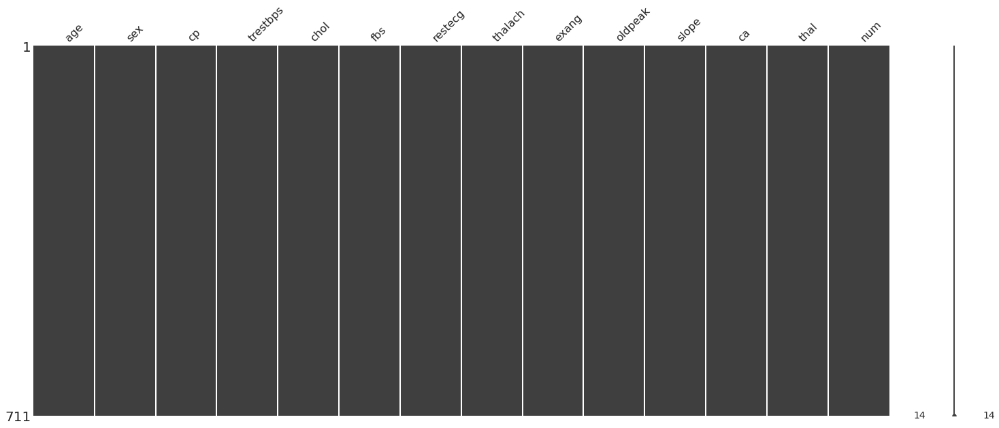

In [ ]:
import missingno as msno
# Visualize missing values as a matrix
msno.matrix(heart_df);

This dataset looks perfect to use as we don’t have null as well as missing values.

## **FIRST IMPRESSION SUMMARY**
info() suggests we have a full dataset w/ no missing values

head() suggests the categorical features described above are already converted for us

.value_counts() suggest out binary classifcation problem is well balanced & a metric like accuracy is quite approapriate here.

## Pandas Profile to check - Exclusive EDA

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
# Generate the Profiling Report
profile = ProfileReport(
    heart_df, title=" UCI Heart Disease ", html={"style": {"full_width": True}}, sort=None
)

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Creating Dataset with target variable having binary values

Update row values to 1 where target_class values > 0

In [ ]:
heart_df_base = heart_df.copy()
# Creating new column that we can use for binary classification
heart_df['num_binary_class'] = heart_df['num'] 

# Update row values to 1 where target_class values > 0
heart_df.loc[heart_df['num_binary_class'] > 0, 'num_binary_class'] = 1
heart_df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num,num_binary_class
0,32.00,1.00,1.00,95.00,0.00,0.00,0.00,127.00,0.00,0.70,1.00,0.00,3.00,1,1
3,36.00,1.00,4.00,110.00,0.00,0.00,0.00,125.00,1.00,1.00,2.00,0.00,6.00,1,1
4,38.00,0.00,4.00,105.00,0.00,0.00,0.00,166.00,0.00,2.80,1.00,0.00,3.00,2,1
5,38.00,0.00,4.00,110.00,0.00,0.00,0.00,156.00,0.00,0.00,2.00,0.00,3.00,1,1
6,38.00,1.00,3.00,100.00,0.00,0.00,0.00,179.00,0.00,-1.10,1.00,0.00,3.00,0,0


In [ ]:
heart_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 711 entries, 0 to 302
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               711 non-null    float64
 1   sex               711 non-null    float64
 2   cp                711 non-null    float64
 3   trestbps          711 non-null    float64
 4   chol              711 non-null    float64
 5   fbs               711 non-null    float64
 6   restecg           711 non-null    float64
 7   thalach           711 non-null    float64
 8   exang             711 non-null    float64
 9   oldpeak           711 non-null    float64
 10  slope             711 non-null    float64
 11  ca                711 non-null    float64
 12  thal              711 non-null    float64
 13  num               711 non-null    int64  
 14  num_binary_class  711 non-null    int64  
dtypes: float64(13), int64(2)
memory usage: 105.0 KB


## Check for statistical inference

In [ ]:
heart_stat_df = heart_df.drop(columns=['sex', 'num','num_binary_class'])
heart_stat_df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,711.00,51.90,9.14,28.00,45.00,53.00,58.00,77.00
cp,711.00,3.18,0.95,1.00,2.00,4.00,4.00,4.00
trestbps,711.00,131.78,18.49,80.00,120.00,130.00,140.00,200.00
chol,711.00,199.89,112.25,0.00,176.50,225.00,269.00,603.00
fbs,711.00,0.10,0.30,0.00,0.00,0.00,0.00,1.00
restecg,711.00,0.57,0.84,0.00,0.00,0.00,1.00,2.00
thalach,711.00,140.81,25.50,60.00,122.00,143.00,160.00,202.00
exang,711.00,0.34,0.47,0.00,0.00,0.00,1.00,1.00
oldpeak,711.00,0.79,1.07,-2.60,0.00,0.20,1.50,6.20
slope,711.00,1.79,0.51,1.00,1.00,2.00,2.00,3.00


## Observing the correlation between features

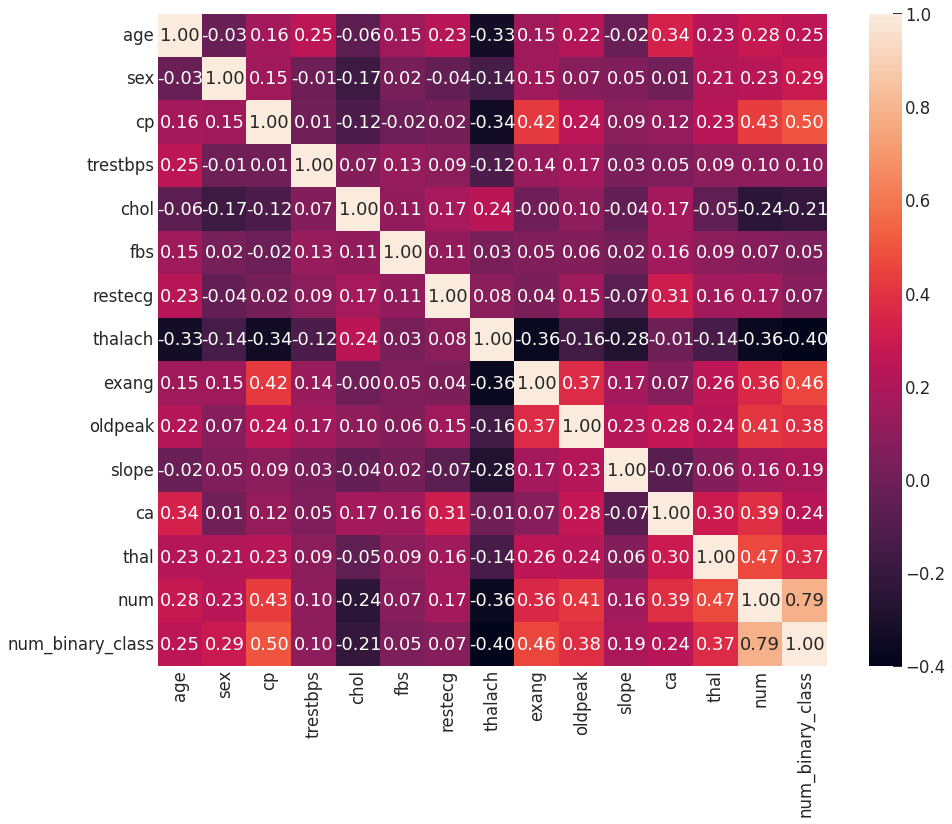

In [ ]:
sns.set_context("talk")
plt.figure(figsize=(15, 12))
sns.heatmap(heart_df.corr(), annot=True, fmt=".2f");

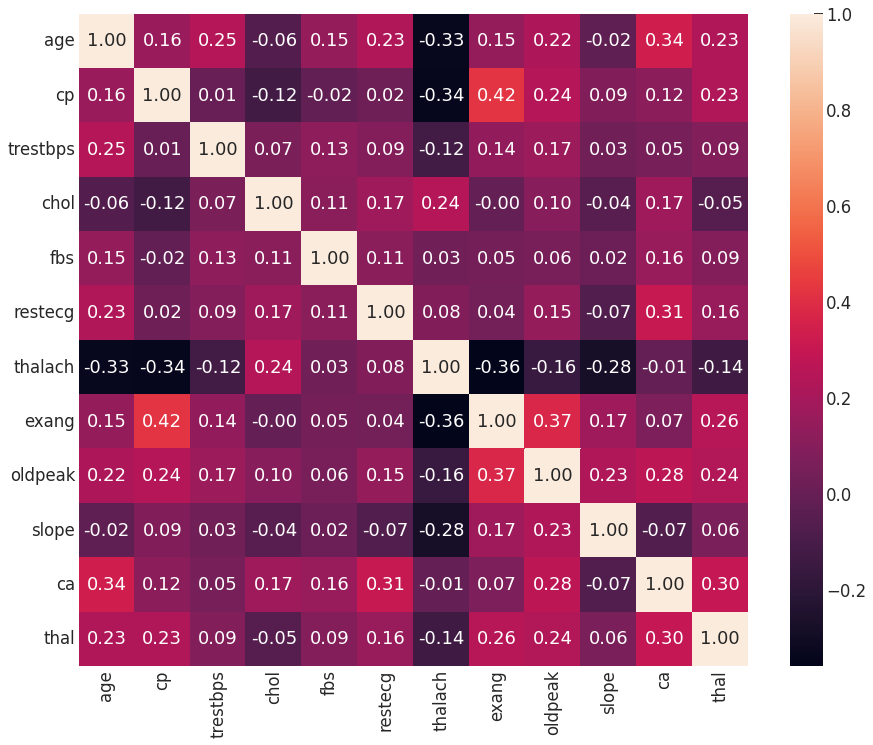

In [ ]:
sns.set_context("talk")
plt.figure(figsize=(15, 12))
sns.heatmap(heart_stat_df.corr(), annot=True, fmt=".2f");

## Understanding the target data values

## Checking the imbalance of data for binary classification

In [ ]:
print(f"Count of person with no heart disease : {heart_df[heart_df['num_binary_class']==0]['num_binary_class'].count()}")
print(f"Count of person with heart disease : {heart_df[heart_df['num_binary_class']==1]['num_binary_class'].count()}")

Count of person with no heart disease : 359
Count of person with heart disease : 352


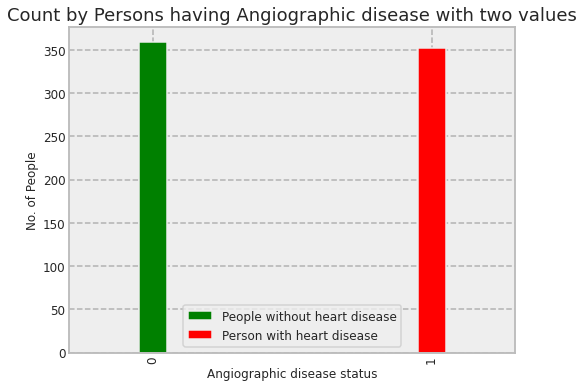

In [ ]:
ax = heart_df.num_binary_class.value_counts().plot(kind="bar",width=0.1,color=["green","red"],figsize=(8,6),
                                                 title="Count by Persons having Angiographic disease with two values", )
plt.ylabel("No. of People", fontsize=12)
plt.xlabel('Angiographic disease status', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
patches, _ = ax.get_legend_handles_labels()
labels = ["People without heart disease","Person with heart disease"]
ax.legend(*patches, labels, loc='best',fontsize=12)
plt.show()

Observation: Dataset has no data imbalance

## Correlation of other features with respect to target varible

### Correlation of other features when target value is having more than one value

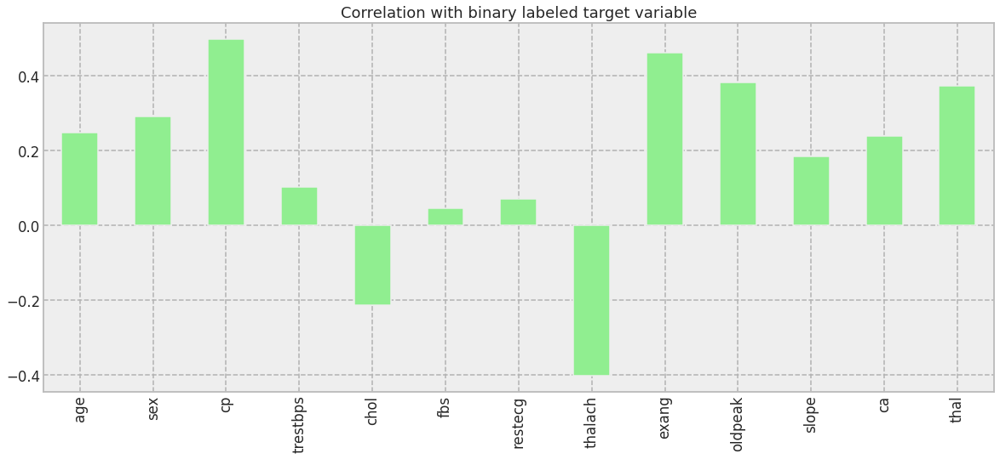

In [ ]:
heart_df.drop(columns=['num','num_binary_class'], axis=1).corrwith(heart_df.num_binary_class).plot(kind='bar', 
                                                                                                                  grid=True, 
                                                                                                                  figsize=(20, 8), 
                                                                                                                  title="Correlation with binary labeled target variable",
                                                                                                                  color="lightgreen");


Observations from correlation:

fbs there is no correlation

chol has the least correlation with the target variable.

All other variables have a significant correlation with the target variable.

## Checking for Categorical and Continous Values:

In [ ]:
categorical_val = []
continous_val = []
for column in heart_df.drop(columns=['num','num_binary_class'], axis=1).columns:
    print('-------------------------------')
    print(f"{column} : {heart_df[column].unique()}")
    if len(heart_df[column].unique()) <= 10:
        categorical_val.append(column)
    else:
        continous_val.append(column)

-------------------------------
age : [32. 36. 38. 40. 41. 42. 43. 45. 46. 47. 48. 50. 51. 52. 53. 54. 55. 56.
 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 72. 73. 74. 28.
 29. 30. 31. 33. 34. 35. 37. 39. 44. 49. 71. 77. 76.]
-------------------------------
sex : [1. 0.]
-------------------------------
cp : [1. 4. 3. 2.]
-------------------------------
trestbps : [ 95. 110. 105. 100. 115. 135. 125. 145. 140. 155. 160. 120. 130. 165.
  80. 180. 170. 200. 150. 185.  98. 112. 190. 142. 132. 108. 124. 113.
 122.  92. 118. 106. 138. 136. 128. 172. 117. 104. 134.  94. 102. 152.
 101. 126. 174. 148. 178. 158. 192. 129. 144. 123. 146. 156. 154. 114.
 164.]
-------------------------------
chol : [  0. 132. 243. 237. 219. 198. 225. 254. 298. 161. 214. 220. 160. 167.
 308. 264. 166. 340. 209. 260. 211. 173. 283. 194. 223. 315. 275. 297.
 292. 182. 200. 204. 241. 339. 147. 273. 307. 289. 215. 281. 250. 184.
 245. 291. 295. 269. 196. 268. 228. 358. 201. 249. 266. 186. 207. 218.
 412. 22

## Histogram for Categorical Values

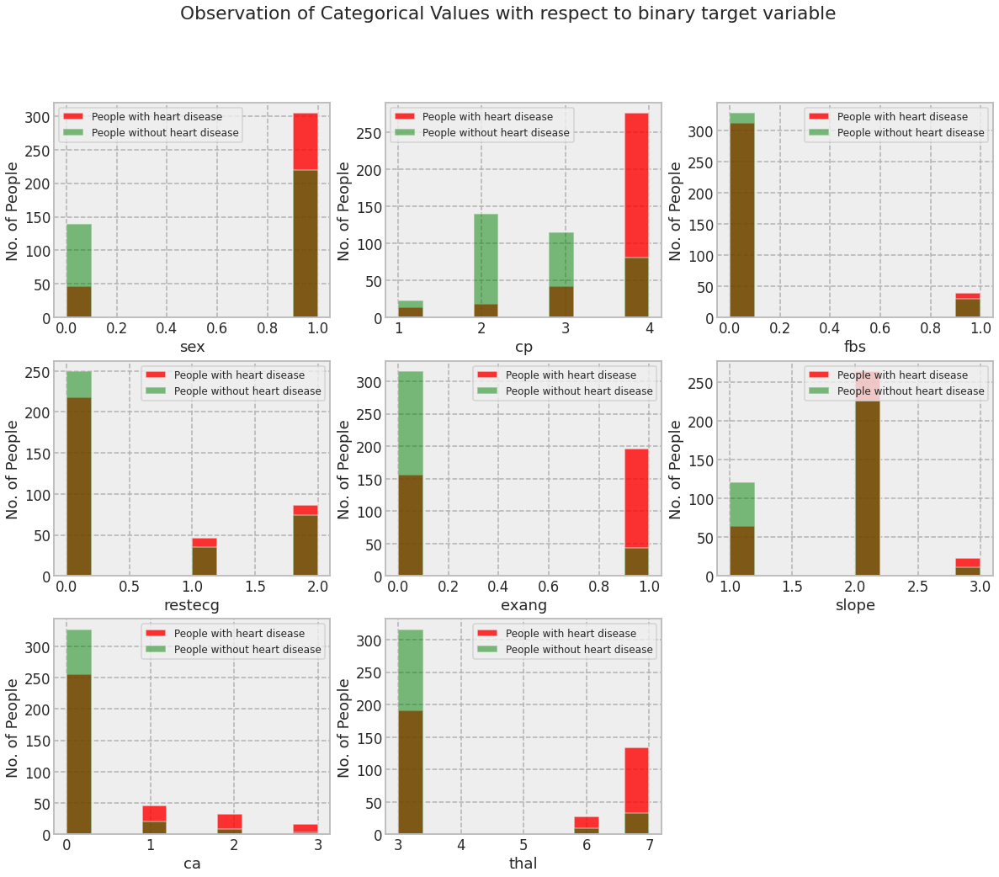

In [ ]:
plt.figure(figsize=(20, 16))
plt.suptitle('Observation of Categorical Values with respect to binary target variable')
for i, column in enumerate(categorical_val, 1):
    plt.subplot(3, 3, i)
    heart_df[heart_df["num_binary_class"] == 1][column].hist(bins=10, color='red', label='People with heart disease',alpha=0.8)
    heart_df[heart_df["num_binary_class"] == 0][column].hist(bins=10, color='green', label='People without heart disease',alpha=0.5)
    plt.legend(fontsize=12)
    plt.xlabel(column)
    plt.ylabel("No. of People")

Observations from the above plot:

cp {Chest pain}: People with cp 1, 2, 3 are more likely to have heart disease than people with cp 0.

restecg {resting EKG results}: People with a value of 1 (reporting an abnormal heart rhythm, which can range from mild symptoms to severe problems) are more likely to have heart disease.

exang {exercise-induced angina}: People with a value of 0 (No - angina induced by exercise) have more heart disease than people with a value of 1 (Yes - angina induced by exercise)

slope {the slope of the ST segment of peak exercise}: People with a slope value of 2 (Downslopins: signs of an unhealthy heart) are more likely to have heart disease than people with a slope value of 2 slope is 0 (Upsloping: best heart rate with exercise) or 1 (Flatsloping: minimal change (typical healthy heart)).

ca {number of major vessels (0-3) stained by fluoroscopy}: The more blood movement the better, so people with ca equal to 0 are more likely to have heart disease.

thal {thalium stress result}: People with a thal value of 2 (defect corrected: once was a defect but ok now) are more likely to have heart disease.

## Histogram for Continuous datavalues

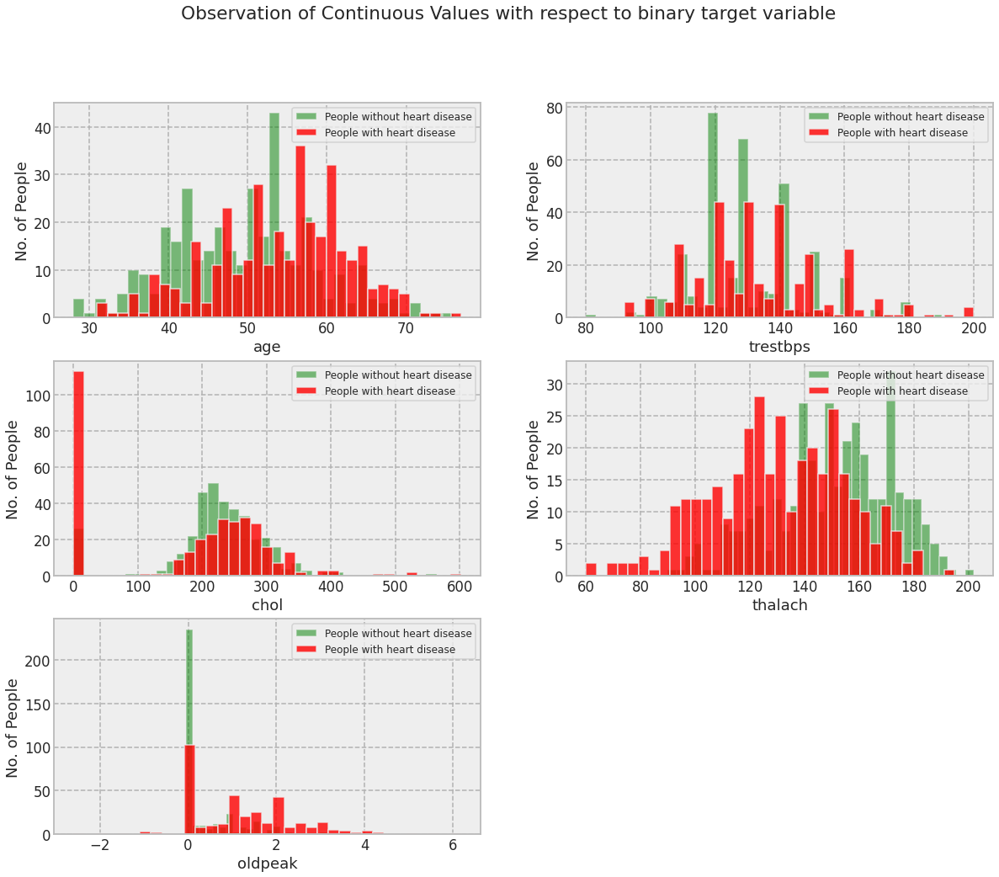

In [ ]:
plt.figure(figsize=(20, 16))
plt.suptitle('Observation of Continuous Values with respect to binary target variable')
for i, column in enumerate(continous_val, 1):
    plt.subplot(3, 2, i)
    heart_df[heart_df["num_binary_class"] == 0][column].hist(bins=35, color='green', label='People without heart disease',alpha=0.5)
    heart_df[heart_df["num_binary_class"] == 1][column].hist(bins=35, color='red', label='People with heart disease', alpha=0.8)
    plt.legend(fontsize=12)
    plt.xlabel(column)
    plt.ylabel("No. of People")

Observations from the above plot:

trestbps: resting blood pressure anything above 120-140 is generally of concern.

chol: greater than 200 is of concern.

thalach: People with a maximum heart rate of over 140 are more likely to have heart disease.

the old peak of exercise-induced ST depression vs. rest looks at heart stress during exercise an unhealthy heart will stress more.


In [ ]:
heart_df["Heart condition"] = heart_df["num_binary_class"].replace({1:"Present", 0:"Not present"})

## SCATTER PLOT (Age Vs Max Heart Rate)

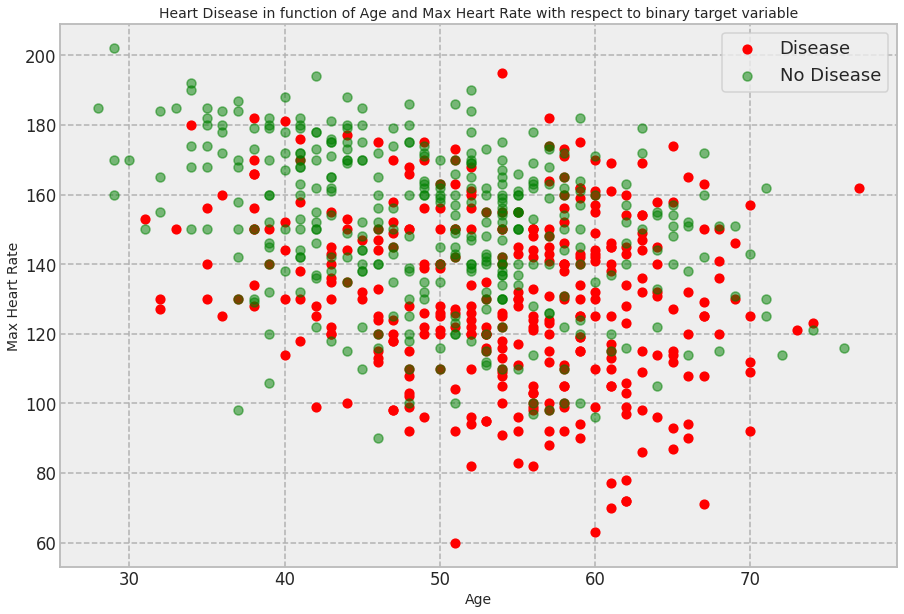

In [ ]:
plt.figure(figsize=(15, 10))
plt.scatter(heart_df.age[heart_df.num_binary_class==1],heart_df.thalach[heart_df.num_binary_class==1],c="red",s=75)
plt.scatter(heart_df.age[heart_df.num_binary_class==0],heart_df.thalach[heart_df.num_binary_class==0],c="green",alpha=0.5)
plt.title("Heart Disease in function of Age and Max Heart Rate with respect to binary target variable",fontsize=14)
plt.xlabel("Age", fontsize=14)
plt.ylabel("Max Heart Rate", fontsize=14)
plt.legend(["Disease", "No Disease"],fontsize=18);

Observation from above plot:

This data isn't correlated at all so it is of no use to us.

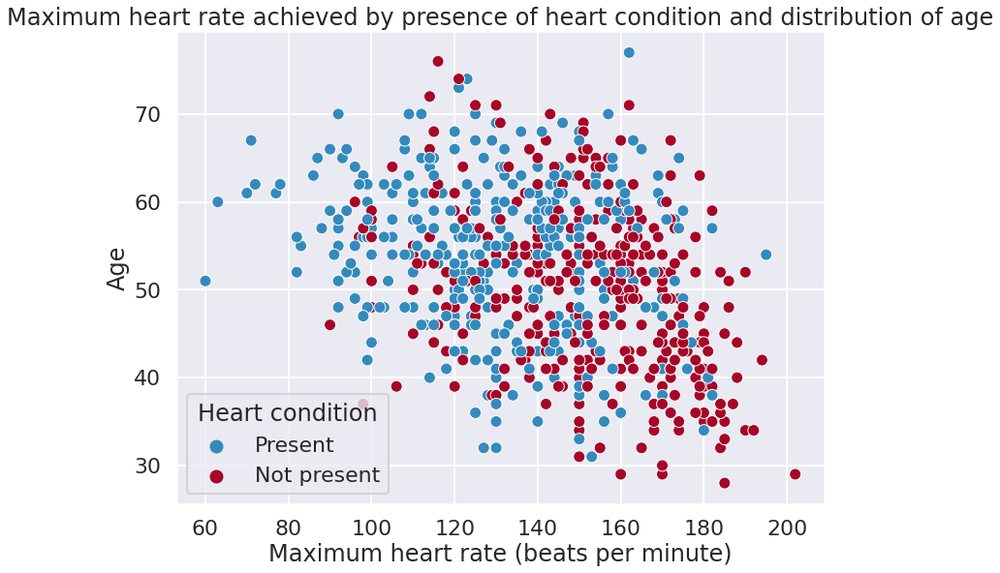

In [ ]:
sns.set_style("darkgrid")
sns.set_context("poster")
plt.figure(figsize=(12, 9))
sns.scatterplot("thalach", "age", hue=heart_df["Heart condition"], data=heart_df)
plt.title("Maximum heart rate achieved by presence of heart condition and distribution of age")
plt.xlabel("Maximum heart rate (beats per minute)")
plt.ylabel("Age")
plt.show()

There's a slight skewing (or clustering) towards the right side of the plot for healthy individuals, meaning individuals that were able to achieve higher maximum heart rates might be more likely to have a healthy heart. It should also be noted that younger individuals could reach higher heart beats per minute, meaning there's an inverse relationship between age and maximum heart rate.

## SCATTER PLOT (Age Vs Serum Cholestoral(mg/dl))

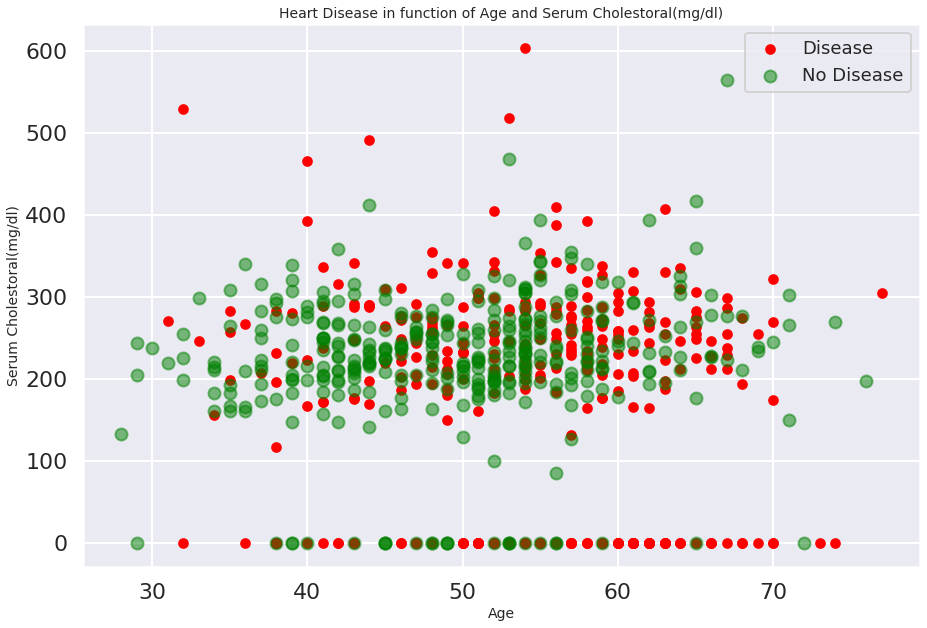

In [ ]:
plt.figure(figsize=(15, 10))
plt.scatter(heart_df.age[heart_df.num>0],heart_df.chol[heart_df.num>0],c="red",s=75)
plt.scatter(heart_df.age[heart_df.num==0],heart_df.chol[heart_df.num==0],c="green",alpha=0.5)
plt.title("Heart Disease in function of Age and Serum Cholestoral(mg/dl)",fontsize=14)
plt.xlabel("Age", fontsize=14)
plt.ylabel("Serum Cholestoral(mg/dl)", fontsize=14)
plt.legend(["Disease", "No Disease"],fontsize=18);

https://www.kaggle.com/code/shubamsumbria/heart-disease-dataset-cleveland-eda

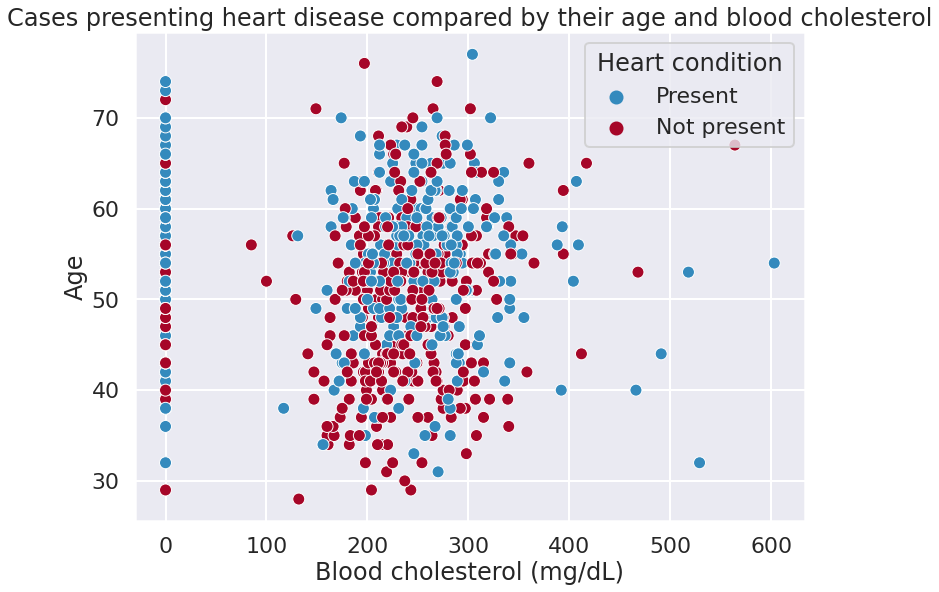

In [ ]:
#Part concerning the actual plotting
sns.set_style("darkgrid")
sns.set_context("poster")
plt.figure(figsize=(12, 9))
sns.scatterplot("chol", "age", hue=heart_df["Heart condition"], data=heart_df)
plt.title("Cases presenting heart disease compared by their age and blood cholesterol")
plt.xlabel("Blood cholesterol (mg/dL)")
plt.ylabel("Age")
plt.show()

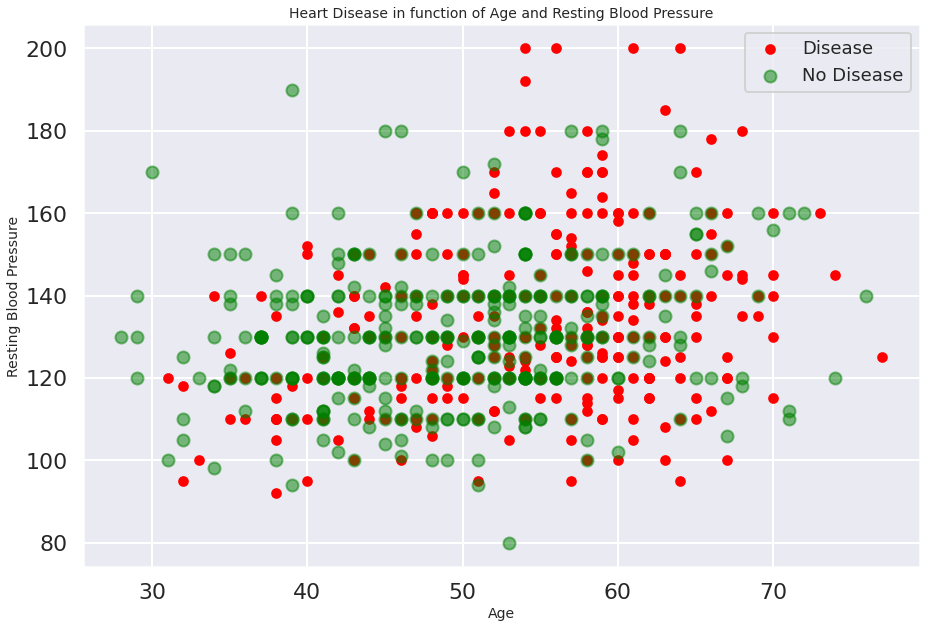

In [ ]:
plt.figure(figsize=(15, 10))
plt.scatter(heart_df.age[heart_df.num>0],heart_df.trestbps[heart_df.num>0],c="red",s=75)
plt.scatter(heart_df.age[heart_df.num==0],heart_df.trestbps[heart_df.num==0],c="green",alpha=0.5)
plt.title("Heart Disease in function of Age and Resting Blood Pressure",fontsize=14)
plt.xlabel("Age", fontsize=14)
plt.ylabel("Resting Blood Pressure", fontsize=14)
plt.legend(["Disease", "No Disease"],fontsize=18);

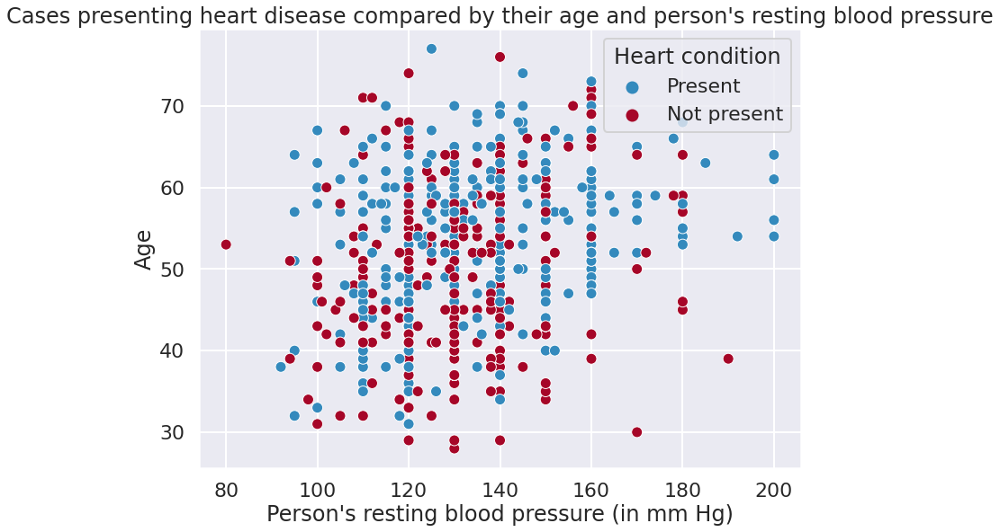

In [ ]:
#Part concerning the actual plotting
sns.set_style("darkgrid")
sns.set_context("poster")
plt.figure(figsize=(12, 9))
sns.scatterplot("trestbps", "age", hue=heart_df["Heart condition"], data=heart_df)
plt.title("Cases presenting heart disease compared by their age and person's resting blood pressure")
plt.xlabel("Person's resting blood pressure (in mm Hg)")
plt.ylabel("Age")
plt.show()

OBSERVATION from above plots(8 & 9):

Both Resting Blood Pressure and Serum Cholesterol shows a bit positive correlation but not that much. Also, Resting Blood Pressure and Serum Cholesterol have few Outliers which we will remove in preprocessing steps

https://www.kaggle.com/code/onatto/predicting-heart-disease-a-detailed-guide

In [ ]:
heart_df.groupby("num_binary_class")[["thalach","chol","age","trestbps"]].mean()

,thalach,chol,age,trestbps
num_binary_class,,,,
0,150.93,223.61,49.66,129.91
1,130.49,175.70,54.18,133.69


I selected all of the numerical columns, took their average, and grouped them by our target column, "target_class".

It appears that the average age of the cases that present with a heart condition were ~4 years younger on average than the people who admitted without a heart disease.

A somewhat significant difference is apparent between the maximum heart rates of people who are sick and healthy, since healthy people were able to reach a 20 beats per minute higher maximum heart rate on average compared to those who are ill.

Those who weren't sick had a lower resting heart rate compared to ill people, however this difference is not that significant (especially compared to the difference between the patients' maximal heart rate) and differs merely by 6 beats per minute on average.

Finally, people without a heart disease had a lower cholesterol count of ~8 mg/dL in their blood serum on average compared to cases that presented with a heart disease.

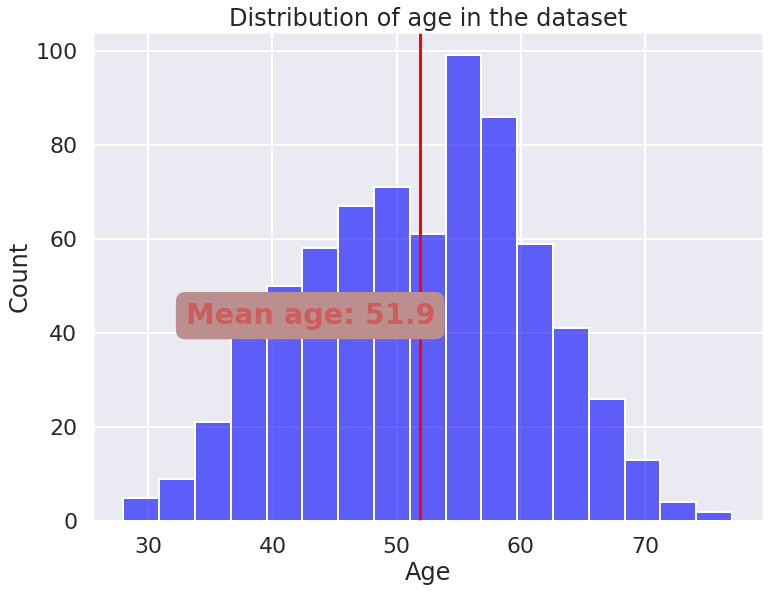

In [ ]:
#Histogram of age distribution
sns.set_style("darkgrid")
sns.set_context("poster")
plt.figure(figsize=(12, 9))
sns.histplot(data=heart_df["age"], alpha=0.6)
plt.axvline(heart_df["age"].mean(), color="red")
plt.title("Distribution of age in the dataset")
plt.text(33, 42, "Mean age: " + str(round(heart_df["age"].mean(), 1)), color="indianred", weight="heavy", size="larger", bbox=dict(boxstyle="round", color="rosybrown"))
plt.xlabel("Age")
plt.ylabel("Count")
plt.show()

In [ ]:
df = heart_df.copy()

Distribution of age in the dataset is somewhat normal-like and the average age is 54.5.

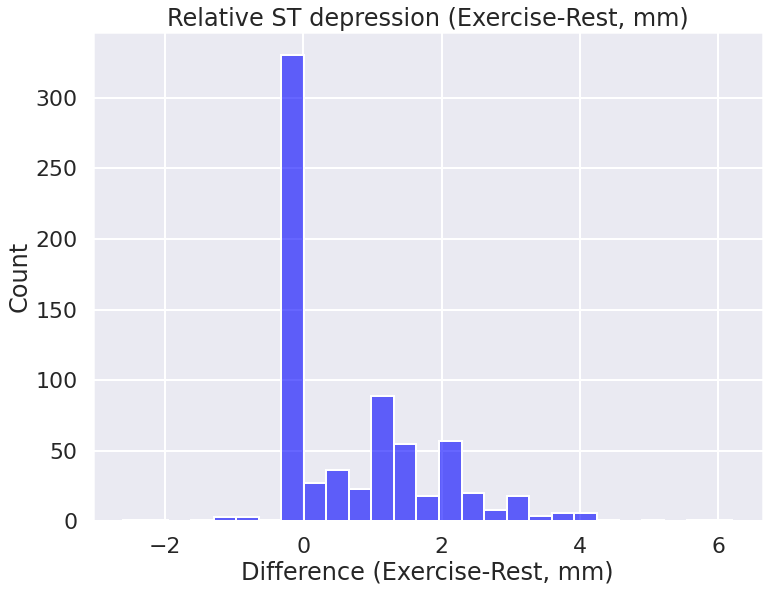

In [ ]:
#Histogram of ST depression distribution
sns.set_style("darkgrid")
sns.set_context("poster")
plt.figure(figsize=(12, 9))
sns.histplot(data=df["oldpeak"], alpha=0.6)
plt.title("Relative ST depression (Exercise-Rest, mm)")
plt.xlabel("Difference (Exercise-Rest, mm)")
plt.ylabel("Count")
plt.show()

Most of the samples fall between a range of 0-2 millimeters' difference regarding the bottom-most points of ST segment depressions in ECG charts as the plot above shows. A difference of 2mm was used as a threshold to interrupt stress testing in this (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1768611/) paper, therefore it's possible to argue that the values that go above this range should be treated as anomalies.

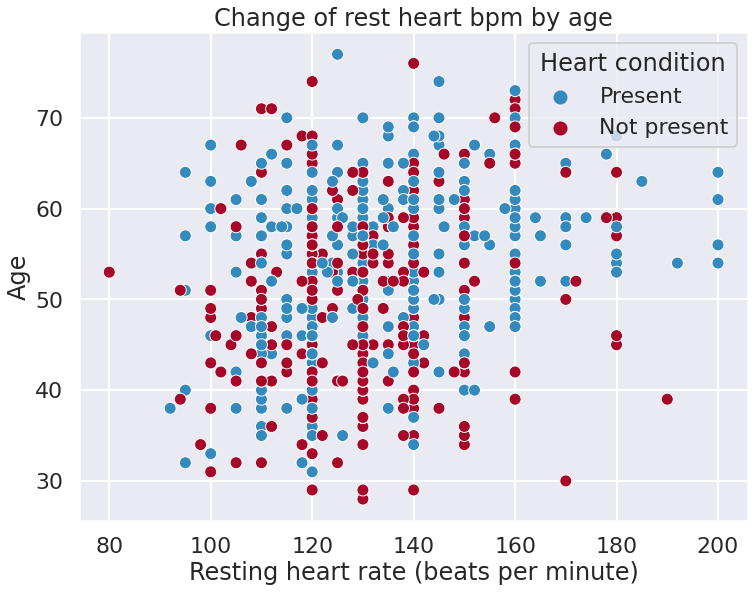

In [ ]:
sns.set_style("darkgrid")
sns.set_context("poster")
plt.figure(figsize=(12, 9))
sns.scatterplot("trestbps", "age", hue=df["Heart condition"], data=df)
plt.title("Change of rest heart bpm by age")
plt.xlabel("Resting heart rate (beats per minute)")
plt.ylabel("Age")
plt.show()

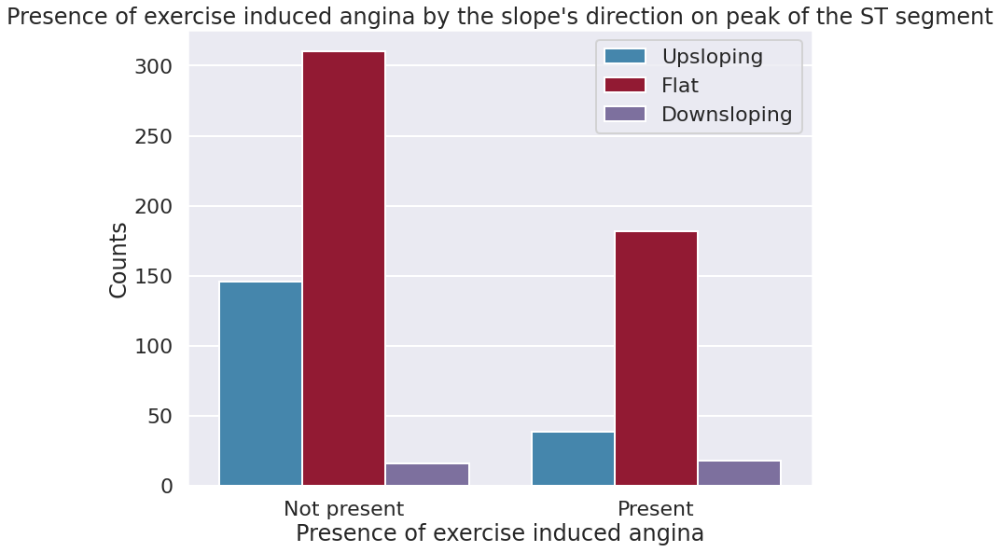

In [ ]:
plt.figure(figsize=(12, 9))
g = sns.countplot("exang", hue="slope", data=df)
g.set_xticklabels(["Not present", "Present"])
plt.title("Presence of exercise induced angina by the slope's direction on peak of the ST segment")
plt.xlabel("Presence of exercise induced angina")
plt.ylabel("Counts")
plt.legend(["Upsloping", "Flat", "Downsloping"])
plt.show()

According to this (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1123032/) article on PubMed: "...The normal ST segment during exercise therefore slopes sharply upwards..."

So simply put, the ST segment slope is expected to be upsloping for healthy individuals during effort testing.

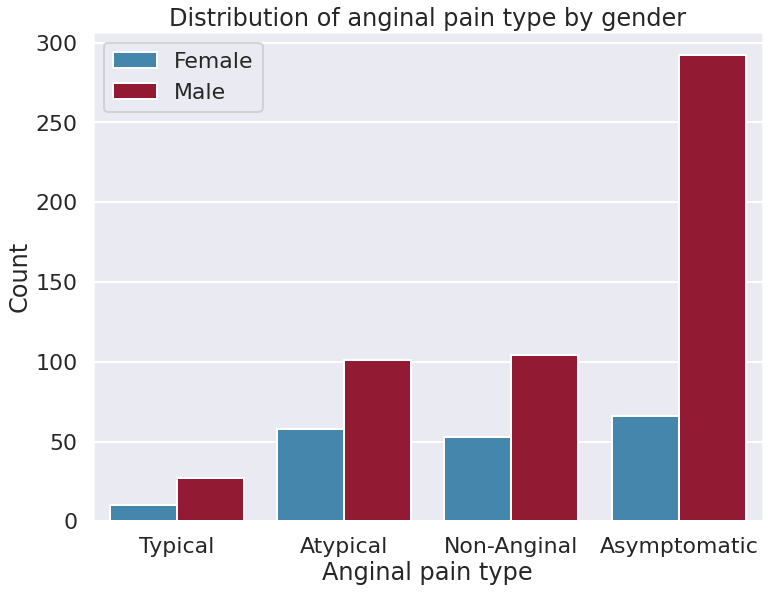

In [ ]:
plt.figure(figsize=(12, 9))
g = sns.countplot("cp", hue="sex", data=df)
g.set_xticklabels(["Typical", "Atypical", "Non-Anginal", "Asymptomatic"])
plt.title("Distribution of anginal pain type by gender")
plt.xlabel("Anginal pain type")
plt.ylabel("Count")
plt.legend(["Female", "Male"])
plt.show()

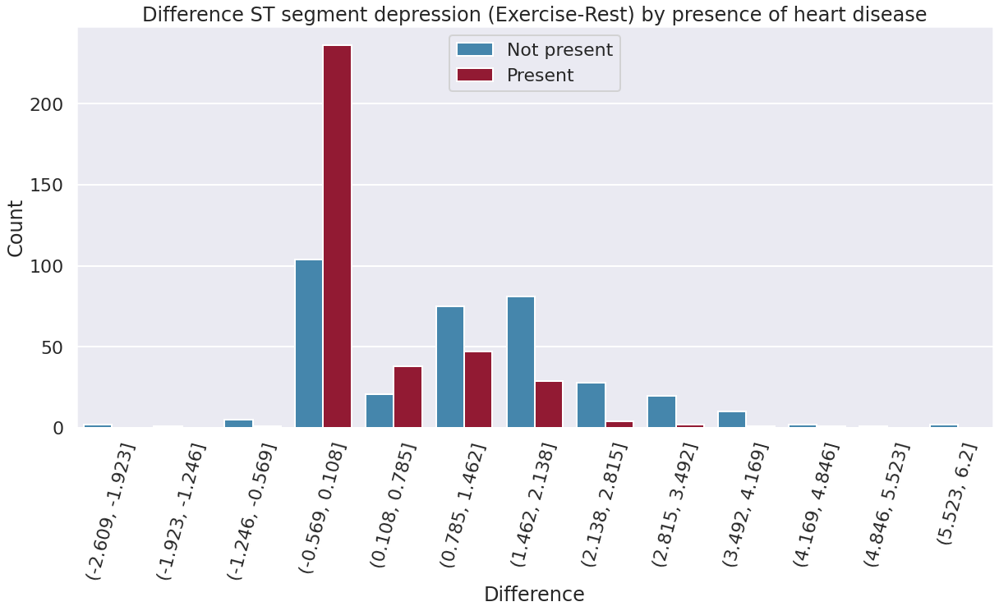

In [ ]:
plt.figure(figsize=(20, 9))
g = sns.countplot(pd.cut(df["oldpeak"], 13), hue="Heart condition", data=df) #I had to bin the x values since there were too many distinct values to interprete
plt.title("Difference ST segment depression (Exercise-Rest) by presence of heart disease")
plt.xlabel("Difference")
plt.ylabel("Count")
plt.xticks(rotation=75)
plt.legend(["Not present", "Present"])
plt.show()

While this might not be the most aesthetic looking plot ever, it clearly shows that the incidence of heart disease presence and difference of ST segment depression during exercise-rest move in the same direction, meaning that as the difference of ST segment depression during exercise against depression during rest gets larger, more likely it gets to encounter a person with heart disease.

# Feature Importance (Feature Selection)

## RandomForest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

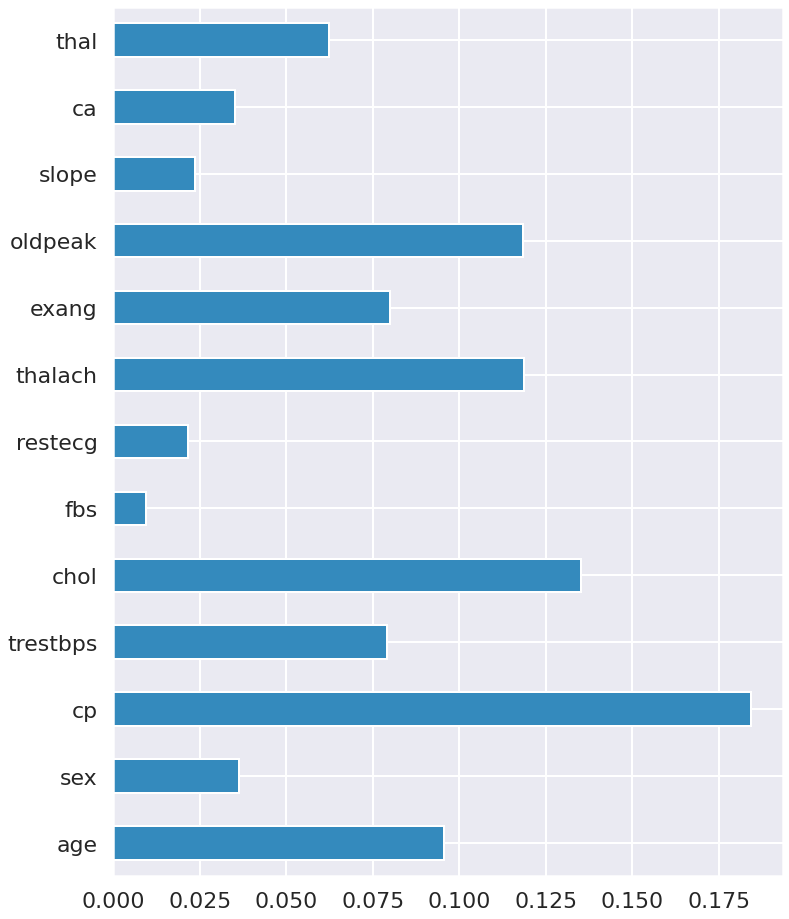

In [ ]:
rf = RandomForestClassifier()
rf.fit(heart_df.drop(columns=['num','num_binary_class', 'Heart condition'], axis=1), heart_df.num_binary_class)
importances = rf.feature_importances_
features = pd.Series(importances, index=heart_df.drop(columns=['num', 'num_binary_class', 'Heart condition'], axis=1).columns)
plt.figure(figsize=(12, 16))
features.plot(kind="barh")
plt.show()

I used a Random Forest Classifier in order to determine feature importances and plotted them.

## Splitting of features as X and target variable Y for binary classification

In [ ]:
X = heart_df.drop(["num", 'num_binary_class', 'Heart condition', 'slope', "restecg", "fbs"], axis=1)
y = heart_df.num_binary_class

## Train Test Split

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

## Data Preprocessing - Scaling of values

In [ ]:
# Standardize features
from sklearn.preprocessing import StandardScaler

In [ ]:
sclr = StandardScaler()
X_train_binary_std = sclr.fit_transform(X_train)
X_test_binary_std = sclr.transform(X_test)

## Evaluation of the model

In [ ]:
#Scikit-Learn models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

# Model Selection
from sklearn.model_selection import cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_validate

# Model Evaluation
from sklearn.metrics import precision_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score  
from sklearn.metrics import f1_score
from sklearn.metrics import make_scorer
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve

https://scikit-learn.org/stable/modules/model_evaluation.html#multiclass-and-multilabel-classification

In [ ]:
# Write your code here to build any 3 models and evaluate them using the required metrics
models = [
    RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42),
    LogisticRegression(random_state=42, multi_class='multinomial', solver='sag', verbose=0, n_jobs=-1),
    DecisionTreeClassifier(random_state=42),
    XGBClassifier(objective="binary:logistic", max_depth=1,
                    n_estimators=500,learning_rate=0.05,colsample_bytree=0.35,subsample=0.5),
    KNeighborsClassifier()
]

cv_df = pd.DataFrame(index=range(len(models)))

entries = []
for model in models:
  results = []

  # For saving precision
  test_prec_macro = [];train_prec_macro  = []
  
  # For saving recall
  test_rec_macro  = [];train_rec_macro  = []
  
  # For saving accuracy
  test_auccuracy  = [];train_auccuracy  = []

  # For saving f1_score
  test_f1_score  = [];train_f1_score  = []

  model_name = model.__class__.__name__
  scoring = {'precision': 'precision_macro',
	'recall': make_scorer(recall_score, average='macro'),
  'auccuracy': 'accuracy',
  'f1_score' : make_scorer(f1_score, average = 'macro')
  }
  scores = cross_validate(model, X_train_binary_std, y_train, scoring=scoring, return_train_score=True, cv=5)
  for p in scores:
    results.append({"param": p, "values": scores[p].tolist()})
    # 
  # print(f'model_name : {model_name}\nscores : {scores}\nresults:{results}',end='\n\n')

  for fold_idx, score_results in enumerate(results):
    # print(f'model_name : {model_name}\nfold_idx : {fold_idx}\nscore_results:{score_results}')
    if fold_idx == 2:
      test_prec_macro =score_results['values']
    elif fold_idx == 3:
      train_prec_macro =score_results['values']
    elif fold_idx == 4:
      test_rec_macro =score_results['values']
    elif fold_idx == 5:
      train_rec_macro =score_results['values']
    elif fold_idx == 6:
      test_auccuracy =score_results['values']
    elif fold_idx == 7:
      train_auccuracy =score_results['values']
    elif fold_idx == 8:
      test_f1_score =score_results['values']
    elif fold_idx == 9:
      train_f1_score =score_results['values']

  # print(f'model_name : {model_name}\nscores : {scores}\nresults:{results}')
  # print(f'model_name : {model_name}\ntest_prec_macro : {test_prec_macro}\ntrain_prec_macro:{train_prec_macro}')
  # print(f'model_name : {model_name}\ntest_rec_macro : {test_rec_macro}\ntrain_rec_macro:{train_rec_macro}')
  # print(f'model_name : {model_name}\ntest_auccuracy : {test_auccuracy}\ntrain_auccuracy:{train_auccuracy}',end='\n\n')

  entries.append((model_name, test_prec_macro, train_prec_macro, test_rec_macro, train_rec_macro, test_auccuracy, train_auccuracy, test_f1_score, train_f1_score))
  # print('',end='\n\n\n')

  # print(f'model_name : {model_name}\n\nScores:{scores.keys()}\nValues:{scores.values()}\n\nResults:{results}\n\nentries:{entries}',end='\n\n\n')
    
cv_df = pd.DataFrame(entries, columns=['model_name', 'test_prec_macro', 'train_prec_macro', 'test_rec_macro', 'train_rec_macro', 'test_auccuracy', 'train_auccuracy', 'test_f1_score', 'train_f1_score'])
cv_df

,model_name,test_prec_macro,train_prec_macro,test_rec_macro,train_rec_macro,test_auccuracy,train_auccuracy,test_f1_score,train_f1_score
0,RandomForestClassifier,"[0.8158705701078584, 0.8510015408320493, 0.843...","[0.9060262994086523, 0.8975272585669782, 0.887...","[0.8155788177339902, 0.8506773399014778, 0.842...","[0.9051043182920913, 0.8962542455118874, 0.887...","[0.8157894736842105, 0.8508771929824561, 0.842...","[0.9052863436123348, 0.8964757709251101, 0.887...","[0.8156618156618157, 0.8507738507738507, 0.841...","[0.9052086216356636, 0.8963626384834694, 0.887..."
1,LogisticRegression,"[0.8245073891625616, 0.8601851851851852, 0.879...","[0.8328572816477218, 0.8393939393939394, 0.823...","[0.8245073891625616, 0.8592980295566502, 0.877...","[0.8324696749150897, 0.8390975254730713, 0.823...","[0.8245614035087719, 0.8596491228070176, 0.877...","[0.8325991189427313, 0.8392070484581498, 0.823...","[0.8245073891625616, 0.8594761171032358, 0.877...","[0.8325178626902765, 0.839143834785352, 0.8237..."
2,DecisionTreeClassifier,"[0.7638416331580575, 0.8106249999999999, 0.781...","[1.0, 1.0, 1.0, 1.0, 1.0]","[0.7626231527093597, 0.8060344827586207, 0.780...","[1.0, 1.0, 1.0, 1.0, 1.0]","[0.7631578947368421, 0.8070175438596491, 0.780...","[1.0, 1.0, 1.0, 1.0, 1.0]","[0.7627014108395651, 0.80606248066811, 0.78054...","[1.0, 1.0, 1.0, 1.0, 1.0]"
3,XGBClassifier,"[0.834364367460563, 0.8420566502463054, 0.8860...","[0.8748639402892241, 0.8746697746697747, 0.861...","[0.832820197044335, 0.8420566502463054, 0.8859...","[0.8743037360504609, 0.874342552159146, 0.8611...","[0.8333333333333334, 0.8421052631578947, 0.885...","[0.8744493392070485, 0.8744493392070485, 0.861...","[0.8330121039241385, 0.8420566502463055, 0.885...","[0.8743755916405738, 0.8743999805858228, 0.861..."
4,KNeighborsClassifier,"[0.853874883286648, 0.8245073891625616, 0.8518...","[0.8886876947040498, 0.8703543307086614, 0.862...","[0.8500615763546798, 0.8245073891625616, 0.850...","[0.8874429888403688, 0.8651431344007763, 0.860...","[0.8508771929824561, 0.8245614035087719, 0.850...","[0.8876651982378855, 0.8656387665198237, 0.861...","[0.8503128137792539, 0.8245073891625616, 0.850...","[0.8875424375033392, 0.8650882961880404, 0.861..."


In [ ]:
modal_metrics = []
for modalname in cv_df.model_name:
  mean_accuracy_train = np.mean(cv_df.loc[cv_df['model_name'] == modalname, 'train_auccuracy'].item())
  mean_accuracy_test = np.mean(cv_df.loc[cv_df['model_name'] == modalname, 'test_auccuracy'].item())

  std_accuracy_train = np.std(cv_df.loc[cv_df['model_name'] == modalname, 'train_auccuracy'].item())
  std_accuracy_test = np.std(cv_df.loc[cv_df['model_name'] == modalname, 'test_auccuracy'].item())
  
  mean_recall_train = np.mean(cv_df.loc[cv_df['model_name'] == modalname, 'train_rec_macro'].item())
  mean_recall_test = np.mean(cv_df.loc[cv_df['model_name'] == modalname, 'test_rec_macro'].item())
  
  mean_precision_train = np.mean(cv_df.loc[cv_df['model_name'] == modalname, 'train_prec_macro'].item())
  mean_precision_test = np.mean(cv_df.loc[cv_df['model_name'] == modalname, 'test_prec_macro'].item())
  
  mean_f1_score_train = np.mean(cv_df.loc[cv_df['model_name'] == modalname, 'train_f1_score'].item())
  mean_f1_score_test = np.mean(cv_df.loc[cv_df['model_name'] == modalname, 'test_f1_score'].item())

  modal_metrics.append((modalname, mean_accuracy_train, mean_accuracy_test, mean_recall_train, mean_recall_test, mean_precision_train, mean_precision_test, mean_f1_score_train, mean_f1_score_test))

modal_metrics_df = pd.DataFrame(modal_metrics, columns=['model_name', 'train_auccuracy', 'test_auccuracy', 'train_recall', 'test_recall', 'train_precision', 'test_precision', 'train_f1_score', 'test_f1_score'])
modal_metrics_df

,model_name,train_auccuracy,test_auccuracy,train_recall,test_recall,train_precision,test_precision,train_f1_score,test_f1_score
0,RandomForestClassifier,0.90,0.82,0.90,0.82,0.90,0.82,0.90,0.82
1,LogisticRegression,0.84,0.83,0.84,0.83,0.84,0.83,0.84,0.83
2,DecisionTreeClassifier,1.00,0.76,1.00,0.76,1.00,0.76,1.00,0.76
3,XGBClassifier,0.87,0.83,0.87,0.83,0.87,0.83,0.87,0.83
4,KNeighborsClassifier,0.87,0.83,0.87,0.83,0.87,0.83,0.87,0.83


Using **cross_val_score** function to evaluate each model's accuracy as scoring parameter

In [ ]:
# Write your code here to build any 3 models and evaluate them using the required metrics
cv_df = pd.DataFrame(index=range(len(models)))

entries = []
for model in models:
  model_name = model.__class__.__name__
  accuracies = cross_val_score(model,  X_train_binary_std, y_train, scoring='accuracy', cv=5)
  for fold_idx, accuracy in enumerate(accuracies):
    entries.append((model_name, fold_idx, accuracy))
    
cv_df = pd.DataFrame(entries, columns=['model_name', 'fold_idx', 'accuracy'])

mean_accuracy = cv_df.groupby('model_name').accuracy.mean()
std_accuracy = cv_df.groupby('model_name').accuracy.std()

acc = pd.concat([mean_accuracy, std_accuracy], axis= 1, ignore_index=True)
acc.columns = ['Mean Accuracy', 'Standard deviation']
acc

,Mean Accuracy,Standard deviation
model_name,,
DecisionTreeClassifier,0.76,0.03
KNeighborsClassifier,0.83,0.03
LogisticRegression,0.83,0.04
RandomForestClassifier,0.82,0.03
XGBClassifier,0.83,0.04


In [ ]:
# Define a function to fit and score our models
def fit_and_score(models, X_train, X_test, y_train, y_test):
    """
    Fits and evaluates given machine learning models.
    models: a dict of different Scikit-Learn machine learning models
    X_train : training data (no labels)
    X_test : testing data (no labels) 
    y_train : training labels
    y_test : test labels
    """
    # Setup random seed
    np.random.seed(42)
    
    # Setup an empty dictionary to record scores 
    model_scores = {}
    model_fit = {}
    
    # Iterating over models
    for model in models:
        # Name of the model
        name = model.__class__.__name__
        # Fit the model
        model.fit(X_train, y_train)
        # Scoring the model and update model_scores
        model_scores[name] = model.score(X_test, y_test)
    
    return model_scores

In [ ]:
model_scores = fit_and_score(models,
                             X_train = X_train_binary_std,
                             X_test = X_test_binary_std,
                             y_train = y_train,
                             y_test = y_test)

model_scores

{'RandomForestClassifier': 0.8461538461538461,
 'LogisticRegression': 0.8321678321678322,
 'DecisionTreeClassifier': 0.7412587412587412,
 'XGBClassifier': 0.8181818181818182,
 'KNeighborsClassifier': 0.8111888111888111}

Model Comparison

Plotting models accuracy

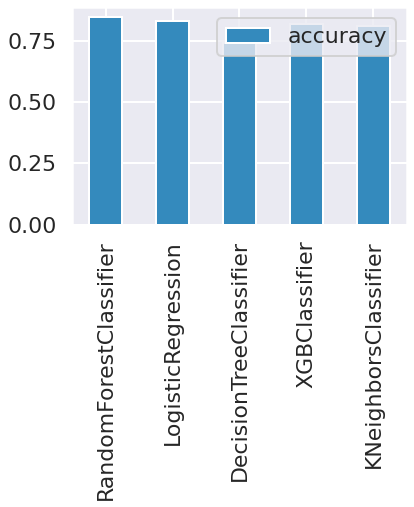

In [ ]:
model_compare = pd.DataFrame(model_scores, index = ["accuracy"])
model_compare.T.plot(kind='bar');

https://www.kaggle.com/code/lapodini/heart-disease-classification-project

https://www.kaggle.com/code/datafan07/heart-disease-and-some-scikit-learn-magic --  see for visualisations


https://towardsdatascience.com/6-ways-to-test-for-a-normal-distribution-which-one-to-use-9dcf47d8fa93

# XAI Techniques

The method of **Feature Importance** is a powerful tool in gaining insights into black box models under the assumption that there is no correlation between features of the given data set. However, this fundamental assumption can often be rejected in reality. PDPs may suffer in their interpretability, if this assumption is violated. Not only the interpretability of PDPs can be affected, but also the interpretability of Feature Importance can strongly depend on the correlations between the input features. In the case of correlated features in the data, which are very likely to occur in reality, the results of the Feature Importance method do not reflect the individual true Feature Importance anymore.

## Partial Dependency Plots for Feature Importance & Feature Interactions


https://towardsdatascience.com/partial-dependence-plots-with-scikit-learn-966ace4864fc

In [ ]:
from sklearn.inspection import (partial_dependence, 
                                PartialDependenceDisplay)

In [ ]:
rf = models[0]
rf.fit(X_train, y_train)

def evaluate(model, X_train, y_train, X_test, y_test):
    name = str(model).split('(')[0]
    print(f"========== {name} ==========")
    y_train_pred = model.predict_proba(X_train)[:,1]
    roc_auc_train = roc_auc_score(y_train, y_train_pred)
    print(f"Train ROC AUC: {roc_auc_train:.4f}")
    
    y_test_pred = model.predict_proba(X_test)[:,1]
    roc_auc_test = roc_auc_score(y_test, y_test_pred)
    print(f"Test ROC AUC: {roc_auc_test:.4f}")
    
evaluate(rf, X_train, y_train, X_test, y_test)

========== RandomForestClassifier ==========
Train ROC AUC: 0.9611
Test ROC AUC: 0.9308


We will plot one for pclass using PartialDependenceDisplay:

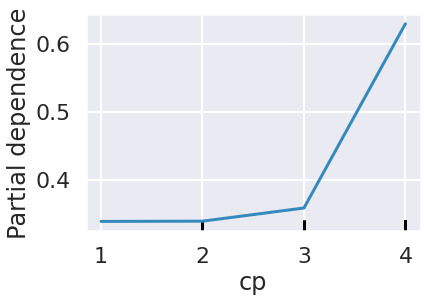

In [ ]:
var = 'cp'
PartialDependenceDisplay.from_estimator(rf, X_train, [var]);

##### PDPs show the average effect on predictions as the value of feature changes.

In the plot above, vertical axis shows the predicted probability and horizontal axis shows ***cp*** values. The blue line captures how average predicted probability changes as the ***cp*** values change. We see that the average chest pain probability increases as the value of cp class increases from 1 to 4, where the chest pain has
— Value 0: asymptomatic
— Value 1: atypical angina
— Value 2: non-anginal pain
— Value 3: typical angina

Model-agnostic interpretation methods can be further distinguished into local and global methods. The book is also organized according to this distinction. Global methods describe how features affect the prediction on average. In contrast, local methods aim to explain individual predictions.

## Comparision Analysis by t-sne & Clustering

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

In [ ]:
def visualize_clusters(x, labels, hue = "hls"):
    '''
    Visualization of clusters using t-SNE plots
    '''
    tsne_transformed = TSNE(n_components=2, random_state = 0).fit_transform(x)

    df_tsne_subset = pd.DataFrame()
    df_tsne_subset['tsne-one'] = tsne_transformed[:,0]
    df_tsne_subset['tsne-two'] = tsne_transformed[:,1]
    df_tsne_subset['y'] = labels

    plt.figure(figsize=(6,4))
    sns.scatterplot(
        x="tsne-one", y="tsne-two",
        hue="y",
        palette=sns.color_palette(hue,df_tsne_subset['y'].nunique()),
        data=df_tsne_subset,
        legend="full",
        alpha=1.0
    )
    plt.show()

In [ ]:
# K-means general function
def generateKMeans(n_clusters, data):
  model = KMeans(n_clusters=n_clusters, init='k-means++', random_state=0)
  model.fit(data)
  km_labels = model.predict(data)
  visualize_clusters(data, km_labels)

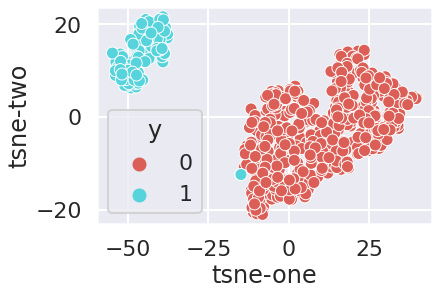

In [ ]:
generateKMeans(n_clusters=2, data=X_train)

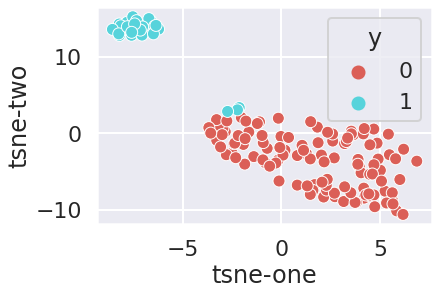

In [ ]:
generateKMeans(n_clusters=2, data=X_test)

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Shap

In [ ]:
import shap 

In [ ]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)[1]

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[0,:], X_test.iloc[0,:])

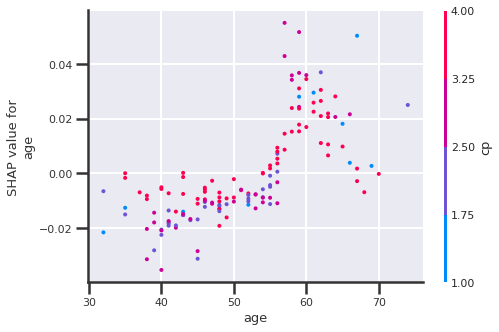

In [ ]:
shap.dependence_plot("age", shap_values, X_test)

Age from 55-60 have high possibility tto have chest pain

## Explainerdashboard

In [ ]:
from explainerdashboard import ClassifierExplainer, ExplainerDashboard

In [ ]:
explainer = ClassifierExplainer(rf, X_test, y_test)
ExplainerDashboard(explainer).run()

Detected RandomForestClassifier model: Changing class type to RandomForestClassifierExplainer...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Building ExplainerDashboard..
Detected google colab environment, setting mode='external'
Generating layout...
Calculating shap values...
Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Calculating shap interaction values... (this may take a while)
Reminder: TreeShap computational complexity is O(TLD^2), where T is the number of trees, L is the maximum number of leaves in any tree and D the maximal depth of any tree. So reducing these will speed up the calculation.
Calculating dependencies...
Calculating permutation importances (if slow, try setti

<IPython.core.display.Javascript object>

In [ ]:
rf.predict_proba

<bound method ForestClassifier.predict_proba of RandomForestClassifier(max_depth=5, random_state=42)>

https://github.com/oracle/Skater/blob/main/examples/IrisClassificationWithSkaterExplainations.ipynb

In [ ]:
print(list(heart_df.columns))

['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'num', 'num_binary_class', 'Heart condition']


In [ ]:
print(list(X.columns))

['age', 'sex', 'cp', 'trestbps', 'chol', 'thalach', 'exang', 'oldpeak', 'ca', 'thal']


In [ ]:
!pip install git+https://github.com/oracle/Skater.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/oracle/Skater.git to /tmp/pip-req-build-8394opx9
  Running command git clone -q https://github.com/oracle/Skater.git /tmp/pip-req-build-8394opx9


In [ ]:
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel

from skater.core.global_interpretation.tree_surrogate import TreeSurrogate
from skater.util.dataops import show_in_notebook

interpreter = Interpretation(
        training_data=X_train, training_labels=y_train, feature_names=list(X.columns)
    )
pyint_model = InMemoryModel(
            rf.predict_proba,
            examples=X_train,
            target_names=['num_binary_class'],
            unique_values=np.unique(y_train).tolist(),
            feature_names=list(X.columns),
        )

PDP plots to show how sepal length affect the models prediction

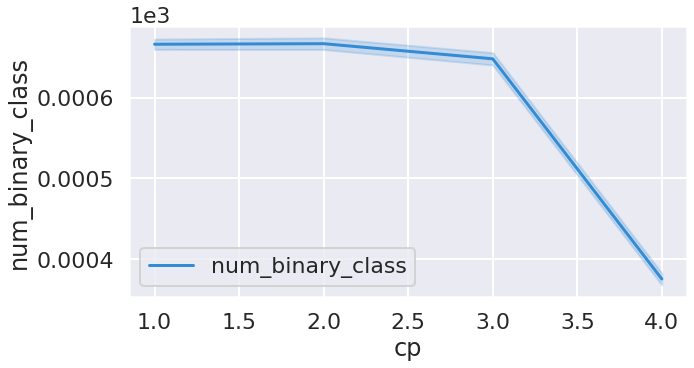

In [ ]:
%matplotlib inline
interpreter.partial_dependence.plot_partial_dependence(
   ['cp'] , pyint_model, n_jobs=-1, progressbar=False, grid_resolution=30, with_variance=True,figsize = (10, 5)
);

2022-12-11 05:04:16,623 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False


[10/10] features ████████████████████ Time elapsed: 1 seconds

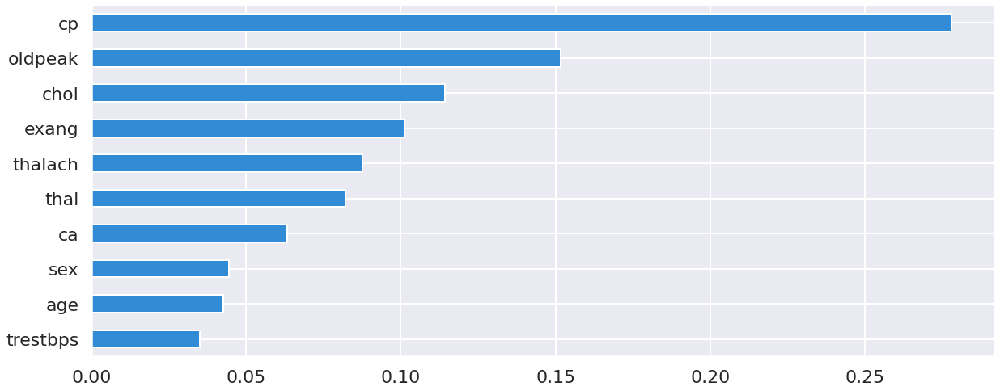

In [ ]:
# Feature Importance
plots = interpreter.feature_importance.plot_feature_importance(pyint_model, ascending=True, progressbar=True,
                                n_jobs=-1)

In [ ]:
# Surrogate tree
surrogate_explainer = interpreter.tree_surrogate(oracle=pyint_model, seed=5)
surrogate_explainer.fit(X_train, y_train)
# surrogate_explainer.plot_global_decisions(show_img=True)

2022-12-11 05:04:18,830 - skater.core.global_interpretation.tree_surrogate - INFO - post pruning applied ...
2022-12-11 05:04:18,840 - skater.core.global_interpretation.tree_surrogate - INFO - Scorer used cross-entropy
2022-12-11 05:04:18,848 - skater.core.global_interpretation.tree_surrogate - INFO - original score using base model 2.2204460492503136e-16
2022-12-11 05:04:19,047 - skater.core.global_interpretation.tree_surrogate - INFO - Summary: childrens of the following nodes are removed [6, 10, 22, 33, 57, 66, 73]
2022-12-11 05:04:19,053 - skater.core.global_interpretation.tree_surrogate - INFO - Done generating prediction using the surrogate, shape (568, 2)
2022-12-11 05:04:19,063 - skater.core.global_interpretation.tree_surrogate - INFO - Done scoring, surrogate score 0.01; oracle score 0.302
2022-12-11 05:04:19,064 - skater.core.global_interpretation.tree_surrogate - WARNING - impurity score: 0.292 of the surrogate model is higher than the impurity threshold: 0.01. The higher th

0.292

In [ ]:
surrogate_explainer.decisions_as_txt()

if cp <= 3.5 {
  if oldpeak <= 2.100000023841858 {
    if trestbps <= 176.0 {
      if ca <= 2.5 {
        if exang <= 0.5 {
          if oldpeak <= -0.4000000059604645 {
            if trestbps <= 110.0 {
          } else {
            if thalach <= 97.5 {
              if oldpeak <= 0.6000000238418579 {
            } else {
                Predicted Label: 0
            }
          }
        } else {
          if chol <= 50.0 {
              Predicted Label: 1
          } else {
            if age <= 53.5 {
                Predicted Label: 0
            } else {
              if thal <= 4.5 {
                if thalach <= 99.5 {
                    Predicted Label: 1
                } else {
                    Predicted Label: 0
                }
              } else {
                if trestbps <= 112.5 {
              }
            }
          }
        }
      } else {
        if thal <= 4.5 {
            Predicted Label: 0
        } else {
            Predicted Label: 1
       

In [ ]:
def evaluate(_clf):
    scores = cross_val_score(_clf, X_train_binary_std, y_train, scoring='accuracy', cv=10)
    # scores = cross_val_score(pipeline,  X_train_binary_std, y_train, scoring='accuracy', cv=5)
    print('Accuracy: {:.3f} ± {:.3f}'.format(np.mean(scores), 2 * np.std(scores)))# Fit the model
    rf.fit(X_train, y_train)
    # _clf.fit(X_train, y_train)  # so that parts of the original pipeline are fitted
     
evaluate(rf)

Accuracy: 0.831 ± 0.096


In [ ]:
importances = rf.feature_importances_
print(importances)
features = pd.Series(importances, index=heart_df.drop(columns=['num', 'num_binary_class', 'Heart condition', 'slope', "restecg", "fbs"], axis=1).columns)
features

[0.04748726 0.03679668 0.30409321 0.04467329 0.1081545  0.09611516
 0.11218491 0.12828824 0.04395009 0.07825666]


age        0.05
sex        0.04
cp         0.30
trestbps   0.04
chol       0.11
thalach    0.10
exang      0.11
oldpeak    0.13
ca         0.04
thal       0.08
dtype: float64

### ELI5 - XAI Technique

In [ ]:
import eli5

In [ ]:
from eli5 import show_weights
show_weights(rf, top=5)

In [ ]:
show_weights(rf, top=10, feature_names=list(X.columns))

Weight,Feature
0.3041 ± 0.3504,cp
0.1283 ± 0.1861,oldpeak
0.1122 ± 0.2501,exang
0.1082 ± 0.1381,chol
0.0961 ± 0.1748,thalach
0.0783 ± 0.1600,thal
0.0475 ± 0.0642,age
0.0447 ± 0.0588,trestbps
0.0440 ± 0.0856,ca
0.0368 ± 0.0826,sex


In [ ]:
show_weights(rf, top=10, feature_names=list(X.columns), target_names=['num_binary_class'])

Weight,Feature
0.3041 ± 0.3504,cp
0.1283 ± 0.1861,oldpeak
0.1122 ± 0.2501,exang
0.1082 ± 0.1381,chol
0.0961 ± 0.1748,thalach
0.0783 ± 0.1600,thal
0.0475 ± 0.0642,age
0.0447 ± 0.0588,trestbps
0.0440 ± 0.0856,ca
0.0368 ± 0.0826,sex


In [ ]:
eli5.show_weights(rf, feature_names=list(X.columns), targets=['cp', 'age', 'chol'])

Weight,Feature
0.3041 ± 0.3504,cp
0.1283 ± 0.1861,oldpeak
0.1122 ± 0.2501,exang
0.1082 ± 0.1381,chol
0.0961 ± 0.1748,thalach
0.0783 ± 0.1600,thal
0.0475 ± 0.0642,age
0.0447 ± 0.0588,trestbps
0.0440 ± 0.0856,ca
0.0368 ± 0.0826,sex


In [ ]:
eli5.show_weights(rf, top=10, feature_names=list(X.columns))

Weight,Feature
0.3041 ± 0.3504,cp
0.1283 ± 0.1861,oldpeak
0.1122 ± 0.2501,exang
0.1082 ± 0.1381,chol
0.0961 ± 0.1748,thalach
0.0783 ± 0.1600,thal
0.0475 ± 0.0642,age
0.0447 ± 0.0588,trestbps
0.0440 ± 0.0856,ca
0.0368 ± 0.0826,sex


In [ ]:
eli5.show_weights(rf, top=10, show=['targets'])

In [ ]:
eli5.explain_weights(models[0], feature_names=list(X.columns))

Weight,Feature
0.3041 ± 0.3504,cp
0.1283 ± 0.1861,oldpeak
0.1122 ± 0.2501,exang
0.1082 ± 0.1381,chol
0.0961 ± 0.1748,thalach
0.0783 ± 0.1600,thal
0.0475 ± 0.0642,age
0.0447 ± 0.0588,trestbps
0.0440 ± 0.0856,ca
0.0368 ± 0.0826,sex


In [ ]:
models[1]

LogisticRegression(multi_class='multinomial', n_jobs=-1, random_state=42,
                   solver='sag')

In [ ]:
eli5.explain_weights(models[1], feature_names=list(X.columns))

Weight?,Feature
+0.428,cp
+0.301,oldpeak
+0.295,ca
+0.251,thal
+0.226,exang
+0.205,sex
+0.100,trestbps
+0.022,<BIAS>
-0.069,age
-0.203,thalach


In [ ]:
models[2]

DecisionTreeClassifier(random_state=42)

In [ ]:
eli5.explain_weights(models[2])

Weight,Feature
0.3314,x2
0.1454,x4
0.0979,x3
0.0956,x0
0.0920,x5
0.0917,x7
0.0513,x1
0.0420,x9
0.0313,x8
0.0215,x6


In [ ]:
models[3]

XGBClassifier(colsample_bytree=0.35, learning_rate=0.05, max_depth=1,
              n_estimators=500, subsample=0.5)

In [ ]:
eli5.explain_weights(models[3], feature_names=list(X.columns))

Weight,Feature
0.2396,cp
0.1846,exang
0.1161,thal
0.0939,oldpeak
0.0782,sex
0.0722,chol
0.0713,ca
0.0601,thalach
0.0471,age
0.0369,trestbps


In [ ]:
eli5.show_weights(models[2], feature_names=list(X.columns), show=['feature_importances','method'])

Weight,Feature
0.3314,cp
0.1454,chol
0.0979,trestbps
0.0956,age
0.0920,thalach
0.0917,oldpeak
0.0513,sex
0.0420,thal
0.0313,ca
0.0215,exang


In [ ]:
X[:1]

,age,sex,cp,trestbps,chol,thalach,exang,oldpeak,ca,thal
0,32.00,1.00,1.00,95.00,0.00,127.00,0.00,0.70,0.00,3.00


In [ ]:
eli5.explain_prediction(models[0], X[:1], feature_names=list(X.columns))

Explanation(estimator='RandomForestClassifier(max_depth=5, random_state=42)', description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=0, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5031514084507043, std=None, value=1.0), FeatureWeight(feature='cp', weight=0.2018498372091325, std=None, value=1.0), FeatureWeight(feature='exang', weight=0.0705747769160036, std=None, value=0.0), FeatureWeight(feature='oldpeak', weight=0.04377555286730336, std=None, value=0.7), FeatureWeight(feature='thal', weight=0.0351944058862384, std=None, value=3.0), FeatureWeight(feature='age', weight=0.03401964936596325, std=None, value=32.0), FeatureWeight(feature='ca', weight=0.011433738375414339, std=None, value=0.0), FeatureWeight(feature='trestbps', weight=0.002232010799646224, std=None, value=95.0)], neg=[FeatureWeight(feature='chol', weight=-0.13203791635197334, std=None, value=0.0), FeatureWeight(feature='thalach', weight=-0.03326476653579079, std=None, value=127.0), FeatureWeight(feature='sex', weight=-0.01336607252517683, std=None, value=1.0)], pos_remaining=0, neg_remaining=0), proba=0.7235626244574648, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [ ]:
eli5.explain_prediction(models[1], X[:1], feature_names=list(X.columns))

Explanation(estimator="LogisticRegression(multi_class='multinomial', n_jobs=-1, random_state=42,\n                   solver='sag')", description=None, error=None, method='linear model', is_regression=False, targets=[TargetExplanation(target=0, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='thalach', weight=25.837782439245615, std=None, value=127.0), FeatureWeight(feature='age', weight=2.1964697747446507, std=None, value=32.0)], neg=[FeatureWeight(feature='trestbps', weight=-9.470181266357287, std=None, value=95.0), FeatureWeight(feature='thal', weight=-0.7528930188602627, std=None, value=3.0), FeatureWeight(feature='cp', weight=-0.42785589659107576, std=None, value=1.0), FeatureWeight(feature='oldpeak', weight=-0.2109224487997574, std=None, value=0.7), FeatureWeight(feature='sex', weight=-0.20520973070450388, std=None, value=1.0), FeatureWeight(feature='<BIAS>', weight=-0.022332111141344008, std=None, value=1.0)], pos_remaining=0, neg_remaining=0), proba=0.999999999999998, score=-16.944857741536037, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [ ]:
eli5.explain_prediction(models[2], X[:1], feature_names=list(X.columns))

Explanation(estimator='DecisionTreeClassifier(random_state=42)', description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.49471830985915494, std=None, value=1.0), FeatureWeight(feature='cp', weight=0.27739053367826, std=None, value=1.0), FeatureWeight(feature='thal', weight=0.15384615384615385, std=None, value=3.0), FeatureWeight(feature='oldpeak', weight=0.10508413891872537, std=None, value=0.7), FeatureWeight(feature='sex', weight=0.044792833146696576, std=None, value=1.0), FeatureWeight(feature='trestbps', weight=0.006585612968591725, std=None, value=95.0)], neg=[FeatureWeight(feature='thalach', weight=-0.08241758241758246, std=None, value=127.0)], pos_remaining=0, neg_remaining=0), proba=1.0, score=None, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [ ]:
eli5.explain_prediction(models[4], X[:1], feature_names=list(X.columns))

Explanation(estimator='KNeighborsClassifier()', description=None, error='estimator KNeighborsClassifier() is not supported', method=None, is_regression=False, targets=None, feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [ ]:
eli5.explain_prediction(models[3], np.array(X_test)[1], feature_names=list(X.columns))

Explanation(estimator='XGBClassifier(colsample_bytree=0.35, learning_rate=0.05, max_depth=1,\n              n_estimators=500, subsample=0.5)', description='\nFeatures with largest coefficients.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble. Each leaf has an output score, and expected scores can also be\nassigned to parent nodes. Contribution of one feature on the decision path\nis how much expected score changes from parent to child. Weights of all \nfeatures sum to the output score of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision paths', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='oldpeak', weight=1.1867522072704089, std=None, value=1.3), FeatureWeight(feature='cp', weight=0.8625293255349934, std=None, value=2.0), FeatureWeight(feature='thal', weight=0.8574142862945089, std=None, value=3.0), FeatureWeight(feature='trestbps', weight=0.39941722127738494, std=None, value=145.0), FeatureWeight(feature='sex', weight=0.22135165690160646, std=None, value=1.0)], neg=[FeatureWeight(feature='thalach', weight=-0.5511753245987647, std=None, value=123.0), FeatureWeight(feature='chol', weight=-0.5431046812522109, std=None, value=0.0), FeatureWeight(feature='age', weight=-0.31181482322067633, std=None, value=74.0), FeatureWeight(feature='exang', weight=-0.2874998904268885, std=None, value=0.0), FeatureWeight(feature='ca', weight=-0.21136281102681503, std=None, value=0.0), FeatureWeight(feature='<BIAS>', weight=-0.0377469855459473, std=None, value=1.0)], pos_remaining=0, neg_remaining=0), proba=0.82987744, score=1.5847601812076024, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

### Permutation Feature Importance
Permutation feature importance measures the increase in the prediction error of the model after we permuted the feature’s values, which breaks the relationship between the feature and the true outcome.

https://www.kaggle.com/code/dansbecker/permutation-importance

In [ ]:
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(rf, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X.columns.tolist())

Weight,Feature
0.0853 ± 0.0496,cp
0.0476 ± 0.0311,exang
0.0378 ± 0.0392,oldpeak
0.0336 ± 0.0206,chol
0.0308 ± 0.0190,thal
0.0196 ± 0.0186,ca
0.0182 ± 0.0143,thalach
0.0168 ± 0.0112,trestbps
0.0056 ± 0.0186,sex
0.0056 ± 0.0241,age


In [ ]:
eli5.explain_prediction(perm, X[:1], feature_names = X.columns.tolist())

Explanation(estimator='PermutationImportance(estimator=RandomForestClassifier(max_depth=5,\n                                                       random_state=42),\n                      random_state=1)', description=None, error='estimator PermutationImportance(estimator=RandomForestClassifier(max_depth=5,\n                                                       random_state=42),\n                      random_state=1) is not supported', method=None, is_regression=False, targets=None, feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [ ]:
models[3]

XGBClassifier(colsample_bytree=0.35, learning_rate=0.05, max_depth=1,
              n_estimators=500, subsample=0.5)

In [ ]:
booster = models[3].get_booster()
booster.feature_names = X.columns.tolist()
print(booster.get_dump()[5])

0:[cp<0.315950781] yes=1,no=2,missing=1
	1:leaf=-0.0494021103
	2:leaf=0.0483640842



In [ ]:
models[1]

LogisticRegression(multi_class='multinomial', n_jobs=-1, random_state=42,
                   solver='sag')

In [ ]:
from eli5 import show_prediction
show_prediction(models[1], X[:1], show_feature_values=True, feature_names = X.columns.tolist())

In [ ]:
show_prediction(models[1], X[:1], show_feature_values=True, feature_names = X.columns.tolist(), show=['method'])

In [ ]:
rf

RandomForestClassifier(max_depth=5, random_state=42)

In [ ]:
show_prediction(rf, X[:1], show_feature_values=True, feature_names = X.columns.tolist())

In [ ]:
eli5.show_weights(models[3], show_feature_values=True, feature_names = X.columns.tolist(), show=['method'])

In [ ]:
show_prediction(models[3], X[:1], show_feature_values=True, feature_names = X.columns.tolist(), show=['method'])

In [ ]:
show_prediction(rf, X[:1], show_feature_values=True, feature_names = X.columns.tolist(), show=['method'])

In [ ]:
show_prediction(rf, X[:1], show_feature_values=True, feature_names = X.columns.tolist(), show=['description'])

In [ ]:
show_prediction(rf, X[:1], show=['feature_importance'])

https://codete.com/blog/explainable-ai#python-tools

https://dev.to/amananandrai/6-explainable-ai-xai-frameworks-for-transparency-in-ai-3koj

### LIME - XAI Technique

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import lime
import lime.lime_tabular

In [ ]:
largest = X.idxmax(axis=1)
largest.value_counts()

chol        552
trestbps     86
thalach      73
dtype: int64

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, largest, test_size=0.33, random_state=42)
rf = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
rf.fit(X_train, y_train)
confusion_matrix(y_pred=rf.predict(X_test), y_true=y_test)

array([[177,   0,   0],
       [  2,  22,   1],
       [  0,   2,  31]])

In [ ]:
df = pd.DataFrame({'predicted': rf.predict(X_test),
             'actual': y_test,
             'target_binary_value': X_test.index})
df.head(20)

,predicted,actual,target_binary_value
98,chol,chol,98
280,chol,chol,280
95,chol,chol,95
132,chol,chol,132
29,chol,chol,29
28,chol,chol,28
108,trestbps,trestbps,108
100,chol,chol,100
88,trestbps,trestbps,88
31,chol,chol,31


In [ ]:
ix = np.where(X_test.index >= 100)# [0].tolist()[0]
ix

(array([  1,   3,   6,   7,  13,  14,  15,  17,  18,  19,  22,  23,  25,
         27,  28,  29,  32,  33,  37,  39,  40,  42,  45,  46,  47,  49,
         50,  51,  53,  54,  56,  57,  58,  61,  63,  64,  65,  66,  69,
         70,  71,  74,  75,  79,  80,  81,  82,  83,  85,  86,  87,  90,
         91,  92,  93,  94,  95,  97,  99, 100, 101, 102, 103, 106, 107,
        108, 114, 116, 119, 121, 122, 125, 126, 127, 129, 130, 133, 134,
        138, 140, 141, 143, 144, 145, 147, 148, 149, 150, 151, 152, 155,
        156, 157, 158, 159, 160, 161, 164, 166, 169, 171, 173, 177, 178,
        179, 180, 181, 182, 184, 186, 187, 188, 190, 191, 193, 194, 195,
        197, 198, 199, 200, 201, 202, 206, 207, 208, 209, 210, 211, 219,
        222, 223, 225, 226, 229, 232, 234]),)

In [ ]:
ix = np.where(X_test.index >= 150)# [0].tolist()[0]
ix

(array([  1,  13,  15,  17,  18,  19,  25,  27,  28,  29,  32,  33,  39,
         42,  45,  47,  49,  50,  51,  56,  57,  58,  61,  63,  64,  65,
         66,  69,  70,  71,  74,  75,  79,  80,  81,  82,  86,  93,  95,
         97,  99, 101, 102, 107, 108, 114, 119, 121, 122, 127, 129, 130,
        133, 134, 138, 143, 144, 148, 150, 151, 155, 156, 158, 164, 169,
        178, 179, 180, 181, 182, 187, 188, 190, 191, 193, 194, 195, 199,
        200, 201, 202, 207, 209, 210, 219, 222, 223, 225, 226]),)

In [ ]:
ix = np.where(X_test.index >= 200)# [0].tolist()[0]
ix

(array([  1,  13,  15,  17,  19,  25,  27,  29,  33,  42,  45,  50,  56,
         57,  58,  63,  65,  66,  69,  70,  74,  79,  80,  81,  86,  93,
         95,  97, 101, 107, 108, 119, 122, 129, 130, 133, 143, 144, 148,
        151, 155, 164, 169, 179, 180, 181, 182, 187, 188, 191, 193, 199,
        200, 201, 202, 207, 209, 210, 219, 225, 226]),)

In [ ]:
ix = np.where(X_test.index >= 250)# [0].tolist()[0]
ix

(array([  1,  17,  25,  27,  33,  57,  65,  66,  70,  80,  93,  97, 101,
        119, 143, 148, 151, 155, 169, 179, 180, 182, 188, 207, 210]),)

In [ ]:
len(ix)

1

In [ ]:
ix[0]

array([  1,  17,  25,  27,  33,  57,  65,  66,  70,  80,  93,  97, 101,
       119, 143, 148, 151, 155, 169, 179, 180, 182, 188, 207, 210])

In [ ]:
ix[0].tolist()[-10]

148

In [ ]:
np.array(X_test)[ix,:]

array([[[4.30e+01, 1.00e+00, 4.00e+00, 1.40e+02, 2.88e+02, 1.35e+02,
         1.00e+00, 2.00e+00, 0.00e+00, 3.00e+00],
        [5.40e+01, 0.00e+00, 3.00e+00, 1.30e+02, 2.94e+02, 1.00e+02,
         1.00e+00, 0.00e+00, 0.00e+00, 3.00e+00],
        [4.20e+01, 1.00e+00, 3.00e+00, 1.30e+02, 1.80e+02, 1.50e+02,
         0.00e+00, 0.00e+00, 0.00e+00, 3.00e+00],
        [5.60e+01, 1.00e+00, 2.00e+00, 1.20e+02, 2.40e+02, 1.69e+02,
         0.00e+00, 0.00e+00, 0.00e+00, 3.00e+00],
        [7.60e+01, 0.00e+00, 3.00e+00, 1.40e+02, 1.97e+02, 1.16e+02,
         0.00e+00, 1.10e+00, 0.00e+00, 3.00e+00],
        [5.80e+01, 1.00e+00, 4.00e+00, 1.46e+02, 2.18e+02, 1.05e+02,
         0.00e+00, 2.00e+00, 1.00e+00, 7.00e+00],
        [6.40e+01, 1.00e+00, 4.00e+00, 1.28e+02, 2.63e+02, 1.05e+02,
         1.00e+00, 2.00e-01, 1.00e+00, 7.00e+00],
        [4.70e+01, 0.00e+00, 4.00e+00, 1.20e+02, 2.05e+02, 9.80e+01,
         1.00e+00, 2.00e+00, 0.00e+00, 6.00e+00],
        [5.30e+01, 1.00e+00, 4.00e+00, 1.80e+02,

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train), feature_names=X.columns.tolist(), training_labels=largest, class_names=['chol','trestbps','thalach'])
# exp = explainer.explain_instance(np.array(X_test)[ix,:], rf.predict_proba, num_features=3, top_labels=2)
# exp.show_in_notebook(show_table=True, show_all=False)

In [ ]:
exp = explainer.explain_instance(np.array(X_test)[3], rf.predict_proba, num_features=3, top_labels=2)
exp.show_in_notebook(show_table=True, show_all=False)

In [ ]:
exp = explainer.explain_instance(np.array(X_test)[200], rf.predict_proba, num_features=7, top_labels=6)
exp.show_in_notebook(show_table=True, show_all=False)